# **Геомаркетинговое исследование территорий с применением современных методов машинного обучения**


## **Введение**

В данном блокноте мы применим методы геоанализа и машинного обучения для решения практической задачи: определения оптимальных локаций для открытия новой кофейни. Мы соберем, обработаем и проанализируем пространственные данные, обучим модели машинного обучения и визуализируем результаты для принятия обоснованных бизнес-решений.



**В рамках данного блокнота мы:**

*   Произведем сбор геоданных из открытых источников (OpenStreetMap).
*   Вновь поработаем с гексагональными сетками (H3) для агрегации данных.
*   Поймем принципы Feature Engineering для пространственных данных.
*   Применим модели машинного обучения для оценки привлекательности локаций.
*   Разработаем методику расчета итогового потенциала с учетом конкуренции.
*   Визуализируем результаты анализа на интерактивной карте.

## **Раздел 1. Подготовка среды и сбор пространственных данных**





### **1.1. Необходимые инструменты и библиотеки**

Для выполнения анализа нам потребуется ряд специализированных Python-библиотек:

*   `geopandas`: Расширение Pandas для работы с геопространственными данными. Позволяет читать, записывать и манипулировать векторными данными (точки, линии, полигоны).
*   `osmnx`: Библиотека для загрузки данных из OpenStreetMap, включая объекты инфраструктуры и дорожные графы.
*   `h3`: Библиотека для работы с гексагональной сеткой H3.
*   `shapely`: Библиотека для манипуляций и анализа геометрических объектов.
*   `scikit-learn`: Основная библиотека для машинного обучения в Python. Содержит реализации алгоритмов (Random Forest, KMeans), метрик качества и инструментов предобработки (StandardScaler).
*   `leafmap` / `ipyleaflet`: Библиотеки для создания интерактивных карт непосредственно в среде Jupyter Notebook/Colab.
*   `pandas`, `numpy`: Стандартные библиотеки для работы с данными и вычислениями.
*   `matplotlib`, `seaborn`: Библиотеки для статической визуализации данных.
*   `kneed`: Для автоматического определения "локтя" на графике (используется при выборе числа кластеров).

### **1.2. Установка зависимостей**








Первым шагом установим все необходимые библиотеки. Команда `%%capture` подавляет вывод процесса установки. Флаг `-q` (quiet) также уменьшает количество выводимой информации.

In [1]:
%%capture
!pip install scikit-learn geopandas h3pandas h3~=3.0 leafmap mapclassify matplotlib streamlit osmnx kneed openrouteservice polyline -q

In [2]:
# Импортируем основные библиотеки
import geopandas as gpd
import pandas as pd
import numpy as np
import h3 # Библиотека для работы с H3-индексами
from shapely.geometry import box, Polygon # Для создания геометрических объектов
import osmnx as ox # Для загрузки данных из OpenStreetMap
from sklearn.preprocessing import StandardScaler # Для масштабирования признаков
from sklearn.cluster import KMeans, MiniBatchKMeans # Алгоритмы кластеризации
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier # Модели машинного обучения
from sklearn.metrics import silhouette_score, roc_auc_score, accuracy_score, classification_report # Метрики качества
from sklearn.model_selection import train_test_split, cross_val_score # Для разделения данных и кросс-валидации
from sklearn.decomposition import PCA
from sklearn.preprocessing import OneHotEncoder
import leafmap.leafmap as leafmap # Для интерактивных карт
from ipywidgets import HTML # Для форматирования текста во всплывающих окнах карты
from ipyleaflet import AwesomeIcon, Marker, MarkerCluster # Для кастомизации маркеров на карте
import warnings
import matplotlib.pyplot as plt # Для графиков
import seaborn as sns # Для улучшенных графиков
from kneed import KneeLocator # Для автоматизации определения кол-ва кластеров


# Игнорировать предупреждения о будущих изменениях в библиотеках для чистоты вывода
warnings.simplefilter(action='ignore', category=FutureWarning)
warnings.simplefilter(action='ignore', category=UserWarning) # Игнорировать предупреждения от OSMnx/sklearn

### **1.3. Источники геоданных (OpenStreetMap) и выбор области интереса (ROI)**

**OpenStreetMap (OSM)** – это краудсорсинговый проект, предоставляющий бесплатные и открытые геоданные по всему миру. Данные хранятся в виде объектов (узлы, пути, отношения) с набором тегов (ключ=значение), описывающих их характеристики (например, `amenity=cafe`, `building=office`). Библиотека `osmnx` позволяет легко запрашивать и загружать эти данные для определенной территории.

**Область интереса (Region of Interest, ROI)** – это географическая область, в пределах которой будет проводиться анализ. Обычно задается с помощью **ограничивающего прямоугольника (Bounding Box, bbox)**, который определяется координатами его углов (минимальная долгота, минимальная широта, максимальная долгота, максимальная широта). Выбор правильного ROI критичен: слишком маленькая область может не дать репрезентативных результатов, а слишком большая – привести к излишним вычислениям и затратам времени/ресурсов.



### **1.4. Определение ROI и загрузка данных (кофейни, инфраструктура)**



Сначала создадим интерактивную карту, на которой можно вручную нарисовать прямоугольник, определяющий наш ROI. Если прямоугольник не нарисован, будут использованы координаты по умолчанию (в данном случае, часть Москвы).

In [3]:
# Создаем интерактивную карту с центром в Москве
m = leafmap.Map(center=[55.751244, 37.618423], zoom=10)
m # Отображаем карту

Map(center=[55.751244, 37.618423], controls=(ZoomControl(options=['position', 'zoom_in_text', 'zoom_in_title',…

*Инструкция:* На отобразившейся карте используйте инструмент "Нарисовать прямоугольник" (квадратная иконка на панели слева), чтобы выделить интересующую вас область. Затем выполните следующую ячейку кода.

In [4]:
# Получаем координаты нарисованного прямоугольника (bounding box)
bbox = m.user_roi_bounds()

# Если ROI не был нарисован, используем bbox по умолчанию (центр Москвы)
if bbox:
    print(f"Выбранный bounding box: {bbox}")
else:
    # Пример bbox для части Москвы (запад, юг, восток, север)
    bbox = [37.5033, 55.6904, 37.7519, 55.8051]
    print(f"Используется bounding box по умолчанию: {bbox}")

Выбранный bounding box: [37.1633, 55.7866, 37.3953, 55.8691]


In [5]:
# --- Параметры анализа ---
# Разрешение сетки H3 (меньше значение = крупнее гексагоны)
# 10 (~150м сторона), 11 (~58м сторона), 12 (~22м сторона)
h3_resolution = 9 # Выбрано разрешение 9 (~350м сторона гексагона)

# Радиусы анализа (в метрах) для Feature Engineering
near_radius = 150  # Ближайшее окружение (2-3 минуты пешком)
medium_radius = 400 # Среднее окружение (5-7 минут пешком)


target_crs = "EPSG:3857"

In [6]:
# --- Шаг 1: Загрузка данных о существующих магазинах ---
print("Шаг 1: Загрузка данных о существующих магазинах...")
# Теги для поиска магазинов в OSM
grocery_tags = {
    'shop': ['supermarket', 'grocery', 'convenience'],
    'amenity': ['food_market'],
    'building': ['supermarket']
}
try:
    # Получаем геометрии из OSM в пределах bbox
    west, south, east, north = bbox
    grocery_stores = ox.features_from_bbox((west, south, east, north), tags=grocery_tags)
    # Фильтруем только точки и полигоны (иногда попадаются линии)
    grocery_stores = grocery_stores[grocery_stores.geometry.type.isin(['Point', 'Polygon'])]
    if not grocery_stores.empty:
        print(f"Найдено {len(grocery_stores)} магазинов в указанной области")
    else:
        print("В указанной области не найдено магазинов")
        grocery_stores = gpd.GeoDataFrame(geometry=[], crs="EPSG:4326")
except Exception as e:
    print(f"Ошибка при получении данных о магазинах: {e}")
    grocery_stores = gpd.GeoDataFrame(geometry=[], crs="EPSG:4326")

Шаг 1: Загрузка данных о существующих магазинах...
Найдено 540 магазинов в указанной области


In [7]:
factor_tags = {
    # Места притяжения людей (работа, учеба) - ВАЖНО
    'offices': {'building': 'office', 'office': True},
    'education': {'amenity': ['university', 'school', 'college', 'kindergarten']},

    # Жилые зоны - КРИТИЧЕСКИ ВАЖНО
    'residential': {'building': ['apartments', 'residential', 'house', 'dormitory']},

    # КОНКУРЕНТЫ - ДОБАВИТЬ
    'competitors': {
        'shop': ['supermarket', 'grocery', 'convenience', 'department_store'],
        'amenity': ['food_market']
    },

    # Торговля и услуги - ОСТОРОЖНО С КОНКУРЕНТАМИ
    'retail_non_food': {'shop': ['clothes', 'electronics', 'hardware']},  # только НЕпродовольственные
    'services': {'amenity': ['bank', 'post_office', 'pharmacy']},

    # Транспортная доступность - ВАЖНО
    'transport_stops': {'public_transport': 'stop_position', 'highway': 'bus_stop'},
    'transport_hubs': {'railway': ['station', 'subway_entrance'], 'amenity': 'bus_station'},
    'parking': {'amenity': 'parking', 'parking': True},

    # Социальная инфраструктура - ВАЖНО
    'healthcare': {'amenity': ['hospital', 'clinic', 'doctors']},
    'government': {'office': ['government', 'administrative']},

    # Отдых и досуг - УМЕРЕННАЯ ВАЖНОСТЬ
    'parks': {'leisure': ['park', 'garden', 'square', 'playground']},
    'culture': {'amenity': ['theatre', 'cinema', 'library']},

    # Пешеходная инфраструктура - ВАЖНО
    'pedestrian_zones': {'highway': 'pedestrian'},
    'footways': {'highway': ['footway', 'path']},

    # Дорожная сеть - ДЛЯ АНАЛИЗА ДОСТУПНОСТИ
    'main_roads': {'highway': ['primary', 'secondary', 'tertiary']},
    'local_roads': {'highway': ['residential', 'living_street']}
}

In [8]:
print("\nШаг 2: Загрузка данных об основных объектах инфраструктуры...")
# Собираем данные для каждой категории объектов
factors_data = {}
# Используем общий граф дорог для экономии запросов, если нужны дороги/пешеходные пути
graph_proj = None
for factor_name, tags in factor_tags.items():
    print(f"  Загрузка данных: {factor_name}...")
    try:
        if factor_name in ['roads', 'footways', 'pedestrian_zones']:
             # Загружаем граф один раз, если еще не загружен
             if graph_proj is None:
                 print("    Загрузка графа дорог...")
                 graph = ox.graph_from_bbox((west, south, east, north))
                 graph_proj = ox.project_graph(graph) # Проецируем для метрических расчетов
                 print("    Граф дорог загружен и спроецирован.")

             # Получаем ребра (дороги/пути) из графа
             gdf = ox.graph_to_gdfs(graph_proj, nodes=False, edges=True)
             # Фильтруем по нужным типам highway
             if factor_name == 'roads':
                 valid_road_types = tags.get('highway', [])
                 gdf = gdf[gdf['highway'].apply(lambda x: x in valid_road_types if isinstance(x, str) else any(t in valid_road_types for t in x) if isinstance(x, list) else False)]
             elif factor_name == 'footways':
                 valid_foot_types = tags.get('highway', [])
                 gdf = gdf[gdf['highway'].apply(lambda x: x in valid_foot_types if isinstance(x, str) else any(t in valid_foot_types for t in x) if isinstance(x, list) else False)]
             elif factor_name == 'pedestrian_zones': # Пешеходные зоны часто как полигоны, но могут быть и линии
                 # Попробуем загрузить и полигоны отдельно
                 try:
                     gdf_poly = ox.features_from_bbox((west, south, east, north), tags={'highway': 'pedestrian'})
                     gdf_poly = gdf_poly[gdf_poly.geometry.type == 'Polygon'].to_crs(graph_proj.graph['crs'])
                     # Если есть и линии и полигоны, можно их объединить или обрабатывать отдельно
                     # Пока оставим только полигоны для 'pedestrian_zones' для расчета площади
                     gdf = gdf_poly
                 except Exception:
                     print(f"    Не удалось загрузить полигоны для {factor_name}, используем линии из графа (если есть).")
                     valid_ped_types = tags.get('highway', [])
                     gdf = gdf[gdf['highway'].apply(lambda x: x in valid_ped_types if isinstance(x, str) else any(t in valid_ped_types for t in x) if isinstance(x, list) else False)]

        else:
            # Для остальных объектов используем features_from_bbox
            gdf = ox.features_from_bbox((west, south, east, north), tags=tags)
            gdf = gdf[gdf.geometry.type.isin(['Point', 'Polygon'])] # Оставляем точки и полигоны
            gdf = gdf.to_crs(epsg=3857) # Проекция для метрических расчетов

        if not gdf.empty:
            # Убедимся, что CRS установлен правильно после всех операций
            if gdf.crs is None:
                 gdf.crs = "EPSG:3857" # Принудительно ставим, если потерялся
            elif gdf.crs != "EPSG:3857":
                 gdf = gdf.to_crs("EPSG:3857")

            factors_data[factor_name] = gdf
            print(f"    Найдено {len(gdf)} объектов")
        else:
            factors_data[factor_name] = gpd.GeoDataFrame(geometry=[], crs="EPSG:3857")
            print("    Объекты не найдены")
    except Exception as e:
        print(f"    Ошибка при загрузке {factor_name}: {e}")
        import traceback
        traceback.print_exc() # Печатаем traceback для детальной диагностики
        factors_data[factor_name] = gpd.GeoDataFrame(geometry=[], crs="EPSG:3857")

# Перепроецируем магазины в ту же CRS для корреектных расчетов расстояний
if not grocery_stores.empty:
    grocery_stores_proj = grocery_stores.to_crs("EPSG:3857")
else:
    grocery_stores_proj = gpd.GeoDataFrame(geometry=[], crs="EPSG:3857")


Шаг 2: Загрузка данных об основных объектах инфраструктуры...
  Загрузка данных: offices...
    Найдено 314 объектов
  Загрузка данных: education...
    Найдено 226 объектов
  Загрузка данных: residential...
    Найдено 12605 объектов
  Загрузка данных: competitors...
    Найдено 540 объектов
  Загрузка данных: retail_non_food...
    Найдено 225 объектов
  Загрузка данных: services...
    Найдено 337 объектов
  Загрузка данных: transport_stops...
    Найдено 752 объектов
  Загрузка данных: transport_hubs...
    Найдено 28 объектов
  Загрузка данных: parking...
    Найдено 1491 объектов
  Загрузка данных: healthcare...
    Найдено 160 объектов
  Загрузка данных: government...
    Найдено 44 объектов
  Загрузка данных: parks...
    Найдено 1098 объектов
  Загрузка данных: culture...
    Найдено 18 объектов
  Загрузка данных: pedestrian_zones...
    Загрузка графа дорог...
    Граф дорог загружен и спроецирован.
    Найдено 10 объектов
  Загрузка данных: footways...
    Найдено 39532 объ

### **1.5. Пояснение**



*   Мы определили область интереса (ROI) либо вручную, либо используя значения по умолчанию.
*   С помощью `osmnx` и заданных тегов мы загрузили два основных набора данных из OpenStreetMap:
    1.  **Существующие кофейни:** Они будут использоваться для определения фактора конкуренции и как целевая переменная для моделирования привлекательности места расположения (предполагаем, что кофейни чаще открываются в привлекательных местах).
    2.  **Объекты инфраструктуры:** Различные типы объектов (офисы, магазины, остановки, парки и т.д.), которые могут влиять на привлекательность локации для кофейни. Они станут основой для создания признаков.
*   Важным шагом является **проецирование** всех геоданных в единую **метрическую систему координат** (например, UTM или Web Mercator EPSG:3857). Это необходимо для корректного расчета расстояний, площадей и длин в метрах (а не в градусах). Мы использовали CRS загруженного графа дорог для единообразия или EPSG:3857 по умолчанию.
*   Обработка ошибок (`try-except`) важна, так как загрузка данных из OSM может завершиться неудачно (например, из-за проблем с сетью или отсутствия данных). Создание пустых GeoDataFrame позволяет коду выполняться дальше без сбоев.




**Вывод по разделу:** На этом этапе мы собрали "сырые" геоданные, необходимые для дальнейшего анализа. Качество и полнота этих данных напрямую влияют на итоговый результат.

## **Раздел 2. Определение территориальной единицы и инженерия пространственных признаков (Feature Engineering)**


### **2.1. Гексагональные сетки H3 для агрегации данных**


Чтобы анализировать территорию не по отдельным объектам, а по небольшим зонам, удобно использовать **пространственную сетку**. Вместо традиционной квадратной сетки мы будем использовать **гексагональную сетку H3**.

Преимущества гексагонов:

*   Все соседи ячейки находятся примерно на одинаковом расстоянии от ее центра.
*   Они лучше аппроксимируют круговые области (например, зоны пешей доступности).
*   Меньше искажений формы и площади по сравнению с квадратами при проекциях.

**Разрешение H3 (h3\_resolution)** определяет размер ячеек: чем меньше значение, тем крупнее гексагоны. Мы выбрали разрешение `9`, что соответствует гексагонам со стороной около 350 метров – разумный масштаб для анализа локаций под кофейню.





### **2.2. Код: Создание сетки H3**

Сгенерируем H3-ячейки, покрывающие наш ROI, и преобразуем их в GeoDataFrame.

In [9]:
# --- Шаг 3: Создание гексагональной сетки H3 ---
print("\nШаг 3: Создание гексагональной сетки H3...")

# Создаем полигон из bbox (в исходной системе координат WGS84, т.к. h3 работает с lat/lon)
bbox_polygon = box(bbox[0], bbox[1], bbox[2], bbox[3]) # (min_lon, min_lat, max_lon, max_lat)

# Генерируем H3-индексы (строковые идентификаторы ячеек), полностью покрывающие полигон bbox
# h3.polyfill_geojson требует GeoJSON-подобный формат
h3_indexes = list(h3.polyfill_geojson(bbox_polygon.__geo_interface__, h3_resolution))
print(f"  Создано {len(h3_indexes)} гексагональных ячеек с разрешением {h3_resolution}")

# Преобразуем H3-индексы в геометрию полигонов
h3_polygons = []
for h3_idx in h3_indexes:
    # h3.h3_to_geo_boundary возвращает кортеж кортежей (lat, lon)
    h3_boundary_coords = h3.h3_to_geo_boundary(h3_idx, geo_json=False)
    # Преобразуем в формат (lon, lat) для создания объекта Polygon из библиотеки Shapely
    polygon_coords = [(lon, lat) for lat, lon in h3_boundary_coords]
    polygon = Polygon(polygon_coords)
    h3_polygons.append({'h3_index': h3_idx, 'geometry': polygon})

# Создаем GeoDataFrame с ячейками H3 в системе координат WGS84 (EPSG:4326)
h3_gdf = gpd.GeoDataFrame(h3_polygons, crs="EPSG:4326")

# Переводим сетку в ту же метрическую проекцию, что и остальные данные (target_crs определена ранее)
h3_gdf = h3_gdf.to_crs(target_crs)
print(f"  GeoDataFrame с ячейками H3 создан и спроецирован в {target_crs}")


Шаг 3: Создание гексагональной сетки H3...
  Создано 1355 гексагональных ячеек с разрешением 9
  GeoDataFrame с ячейками H3 создан и спроецирован в EPSG:3857


### **2.3. Создание признаков (Feature Engineering) на основе пространственных данных**



Теперь наша задача – для каждой ячейки H3 рассчитать набор **признаков**, характеризующих ее окружение. Этот процесс называется инженерией признаков (**Feature Engineering**). Мы будем использовать данные об инфраструктуре, загруженные на предыдущем шаге.

Основные методы:

*   **Пространственное пересечение (Intersection):** Определяем, какие объекты инфраструктуры попадают внутрь ячейки или в ее окрестность.
*   **Буферизация (Buffering):** Создаем зоны вокруг центра ячейки (или самой ячейки) для анализа ближнего (`near_radius`) и среднего (`medium_radius`) окружения.
*   **Агрегация:** Подсчитываем количество объектов, суммарную площадь (для полигонов) или суммарную длину (для линий) в пределах буферных зон.

Мы рассчитаем следующие типы признаков для каждой ячейки:

*   Количество конкурентов (кофеен) в ближнем и среднем радиусе.
*   Количество и/или площадь/длина различных объектов инфраструктуры (офисы, магазины, остановки, парки, жилые дома, дороги, тротуары и т.д.) в ближнем и/или среднем радиусе.



### **2.4. Извлечение признаков для каждой ячейки H3**

Создадим функции для удобства расчета признаков и применим их ко всем ячейкам сетки.

In [10]:
# --- Шаг 4: Извлечение признаков для каждой ячейки ---
print("\nШаг 4: Извлечение признаков для каждой ячейки...")

# Вспомогательные функции для извлечения признаков
def get_count_features(gdf, cell_near, cell_medium):
    """Извлекает количество объектов в ближнем и среднем радиусах."""
    if gdf.empty: return 0, 0
    return len(gdf[gdf.geometry.intersects(cell_near)]), len(gdf[gdf.geometry.intersects(cell_medium)])

def get_area_near(gdf, cell_near):
    """Рассчитывает площадь полигональных объектов в ближнем радиусе."""
    if gdf.empty: return 0
    near = gdf[gdf.geometry.intersects(cell_near)]
    return near[near.geometry.type == 'Polygon'].area.sum() if not near.empty else 0

def get_length_near(gdf, cell_near):
    """Рассчитывает длину линейных объектов в ближнем радиусе."""
    if gdf.empty: return 0
    try:
        near_clipped = gpd.clip(gdf, cell_near)
        return near_clipped.length.sum() if not near_clipped.empty else 0
    except Exception: return 0

# Извлекаем признаки для каждой ячейки H3
features_list = []
total_cells = len(h3_gdf)

for idx, cell in h3_gdf.iterrows():
    if (idx + 1) % 100 == 0: print(f"  Обработка ячейки {idx + 1}/{total_cells}...")

    # Буферы для анализа
    cell_near = cell.geometry.buffer(near_radius)
    cell_medium = cell.geometry.buffer(medium_radius)
    features = {'h3_index': cell.h3_index}

    # 0. КОНКУРЕНТЫ (продуктовые магазины) - КЛЮЧЕВОЙ ФАКТОР
    features['competitors_near_count'], features['competitors_medium_count'] = get_count_features(grocery_stores_proj, cell_near, cell_medium)

    # 0.1. Дополнительно: анализ типов конкурентов
    if 'shop' in grocery_stores_proj.columns:
        # Супермаркеты (сильные конкуренты)
        supermarkets = grocery_stores_proj[grocery_stores_proj['shop'].isin(['supermarket', 'department_store'])]
        features['supermarkets_near_count'], _ = get_count_features(supermarkets, cell_near, cell_medium)

        # Магазины у дома
        convenience = grocery_stores_proj[grocery_stores_proj['shop'] == 'convenience']
        features['convenience_near_count'], _ = get_count_features(convenience, cell_near, cell_medium)

    # 1. ЖИЛЫЕ ЗОНЫ - ВЫСШИЙ ПРИОРИТЕТ для продуктовых магазинов
    if 'residential' in factors_data:
        features['residential_near_count'], features['residential_medium_count'] = get_count_features(factors_data['residential'], cell_near, cell_medium)
        features['residential_area_near'] = get_area_near(factors_data['residential'], cell_near)

    # 2. ТРАНСПОРТНАЯ ДОСТУПНОСТЬ
    for factor in ['transport_stops', 'transport_hubs', 'parking']:
        if factor in factors_data:
            features[f'{factor}_near_count'], features[f'{factor}_medium_count'] = get_count_features(factors_data[factor], cell_near, cell_medium)

    # 3. СОЦИАЛЬНАЯ ИНФРАСТРУКТУРА
    if 'education' in factors_data:
        features['education_near_count'], features['education_medium_count'] = get_count_features(factors_data['education'], cell_near, cell_medium)

    if 'healthcare' in factors_data:
        features['healthcare_near_count'], features['healthcare_medium_count'] = get_count_features(factors_data['healthcare'], cell_near, cell_medium)

    # 4. РАБОЧИЕ МЕСТА (дневная аудитория)
    for factor in ['offices', 'government']:
        if factor in factors_data:
            features[f'{factor}_near_count'], features[f'{factor}_medium_count'] = get_count_features(factors_data[factor], cell_near, cell_medium)
            features[f'{factor}_area_near'] = get_area_near(factors_data[factor], cell_near)

    # 5. РОЗНИЧНАЯ ТОРГОВЛЯ (НЕпродовольственная) - синергия
    if 'retail_non_food' in factors_data:
        features['retail_non_food_near_count'], features['retail_non_food_medium_count'] = get_count_features(factors_data['retail_non_food'], cell_near, cell_medium)

    # 6. УСЛУГИ
    if 'services' in factors_data:
        features['services_near_count'], features['services_medium_count'] = get_count_features(factors_data['services'], cell_near, cell_medium)

    # 7. ОТДЫХ И ДОСУГ (умеренная важность)
    for factor in ['parks', 'culture', 'fitness']:
        if factor in factors_data:
            features[f'{factor}_near_count'], features[f'{factor}_medium_count'] = get_count_features(factors_data[factor], cell_near, cell_medium)
            if factor == 'parks':
                features['parks_area_near'] = get_area_near(factors_data[factor], cell_near)

    # 8. ПЕШЕХОДНАЯ ИНФРАСТРУКТУРА
    if 'pedestrian_zones' in factors_data:
        features['pedestrian_zone_area_near'] = get_area_near(factors_data['pedestrian_zones'], cell_near) if not factors_data['pedestrian_zones'].empty and factors_data['pedestrian_zones'].geometry.type.iloc[0] == 'Polygon' else 0

    # 9. ДОРОЖНАЯ СЕТЬ
    features['footway_length_near'] = get_length_near(factors_data.get('footways', gpd.GeoDataFrame()), cell_near)
    features['main_road_length_near'] = get_length_near(factors_data.get('main_roads', gpd.GeoDataFrame()), cell_near)
    features['local_road_length_near'] = get_length_near(factors_data.get('local_roads', gpd.GeoDataFrame()), cell_near)

    # 10. АНАЛИЗ "ПИЩЕВЫХ ПУСТЫНЬ"
    features['is_food_desert'] = 1 if (features['competitors_near_count'] == 0 and features.get('residential_near_count', 0) > 0) else 0

    features_list.append(features)

# Создаем DataFrame с признаками и объединяем с геоданными H3
features_df = pd.DataFrame(features_list)
h3_gdf = h3_gdf.merge(features_df, on='h3_index', how='left')

print(f"\n  Извлечено {len(features_df.columns) - 1} признаков для {len(h3_gdf)} ячеек.")


Шаг 4: Извлечение признаков для каждой ячейки...
  Обработка ячейки 100/1355...
  Обработка ячейки 200/1355...
  Обработка ячейки 300/1355...
  Обработка ячейки 400/1355...
  Обработка ячейки 500/1355...
  Обработка ячейки 600/1355...
  Обработка ячейки 700/1355...
  Обработка ячейки 800/1355...
  Обработка ячейки 900/1355...
  Обработка ячейки 1000/1355...
  Обработка ячейки 1100/1355...
  Обработка ячейки 1200/1355...
  Обработка ячейки 1300/1355...

  Извлечено 37 признаков для 1355 ячеек.


### **2.5. Пояснение**



*   Мы написали функции `get_count_features`, `get_area_near`, `get_length_near` для инкапсуляции логики расчета признаков. Они используют методы `geopandas` и `shapely`:
    *   `gdf.geometry.intersects(buffer)`: Проверяет, пересекается ли геометрия объекта с буферной зоной.
    *   `gdf.geometry.buffer(radius)`: Создает полигон буферной зоны вокруг геометрии.
    *   `gpd.clip(gdf, mask)`: Обрезает геометрии в `gdf` по границе полигона `mask`.
    *   `gdf.area`: Рассчитывает площадь полигонов (в единицах системы координат, т.е. кв. метрах для метрической CRS).
    *   `gdf.length`: Рассчитывает длину линий (в единицах системы координат, т.е. метрах для метрической CRS).
*   Для каждой ячейки H3 мы рассчитали буферы ближнего (150м) и среднего (400м) радиуса.
*   В цикле по всем ячейкам мы применили функции расчета признаков к соответствующим слоям данных (`factors_data`, `coffee_shops_proj`).
*   Результаты были собраны в `features_df` и затем объединены с `h3_gdf`, содержащим геометрию ячеек. Теперь `h3_gdf` – это наш основной GeoDataFrame, где каждая строка представляет гексагональную ячейку с ее геометрией и набором признаков окружения.

**Вывод по разделу:** Мы преобразовали разрозненные пространственные данные об объектах в структурированную таблицу признаков, агрегированных по ячейкам сетки H3. Теперь мы можем ее использовать в моделях машинного обучения.

## **Раздел 3. Определение привлекательности места расположения**


### **3.1. Подготовка данных для обученеия моделей машинного обучения (масштабирование, выбор признаков)**


Прежде чем обучать модель, данные нужно подготовить:

1.  **Целевую переменную (y):** Мы хотим смоделировать "привлекательность места расположения" для кофейни. В качестве прокси-переменной (косвенного показателя) будем использовать факт наличия хотя бы одной кофейни в *ближнем* радиусе ячейки (`coffee_shops_near_count > 0`). Идея в том, что существующие кофейни, вероятно, расположены в местах с благоприятными условиями. Это задача **бинарной классификации**.
2.  **Набор признаков (X):** В качестве признаков для построения модели мы используем *все рассчитанные ранее признаки инфраструктуры*, **исключая**:
    *   Идентификаторы (`h3_index`) и геометрию (`geometry`).
    *   Целевую переменную (`has_coffee_shop`).
    *   **Признаки, напрямую связанные с конкурентами** (`coffee_shops_near_count`, `coffee_shops_medium_count`). Мы исключаем их, чтобы модель училась определять привлекательность *самого места расположения*, а не просто копировала расположение существующих кофеен. Фактор конкуренции мы учтем позже, при расчете итогового потенциала.
3.  **Обработка пропусков:** Если в данных есть пропуски (NaN), их нужно обработать (например, заполнить нулями или средними значениями). В нашем коде расчета признаков пропуски маловероятны, но `fillna(0)` добавлена для надежности.
4.  **Масштабирование признаков:** Многие алгоритмы ML (включая KMeans и иногда ансамбли) чувствительны к масштабу признаков. Признаки с большими значениями (например, площадь) могут непропорционально сильно влиять на результат. **StandardScaler** преобразует данные так, чтобы каждый признак имел среднее значение 0 и стандартное отклонение 1.







### **3.2. Формирование обучающей выборки**

In [11]:
# --- Шаг 5: Анализ и подготовка данных для моделирования ---
print("\nШаг 5: Анализ и подготовка данных для моделирования...")

# 1. Определяем целевую переменную: есть ли продуктовый магазин в ближнем радиусе?
h3_gdf['has_grocery_store'] = h3_gdf['competitors_near_count'] > 0
print(f"Распределение целевой переменной (has_grocery_store):")
print(h3_gdf['has_grocery_store'].value_counts(normalize=True))

# 2. Анализ "пищевых пустынь" - дополнительная целевая переменная
h3_gdf['is_food_desert_target'] = ((h3_gdf['competitors_near_count'] == 0) &
                                  (h3_gdf['residential_near_count'] > 10)).astype(int)
print(f"\nРаспределение 'пищевых пустынь':")
print(h3_gdf['is_food_desert_target'].value_counts(normalize=True))

# 3. Определяем признаки для модели
# Исключаем: идентификаторы, геометрию, целевую переменную и прямые признаки конкурентов
excluded_columns = [
    'h3_index', 'geometry',
    'has_grocery_store', 'is_food_desert_target',  # Целевые переменные
    'competitors_near_count', 'competitors_medium_count',  # Прямые конкуренты
    'supermarkets_near_count', 'convenience_near_count',   # Типы конкурентов
    'total_competitors', 'has_strong_competition',         # Агрегированные конкуренты
    'is_food_desert'                                       # Дублирующий признак
]

model_feature_columns = [
    col for col in h3_gdf.columns if col not in excluded_columns
]

print(f"\n  Признаки, используемые для определения оптимального места расположения ({len(model_feature_columns)} шт.):")
print(model_feature_columns)

# 4. Анализ корреляции с целевой переменной (опционально, но полезно)
if len(model_feature_columns) > 0:
    correlation_with_target = h3_gdf[model_feature_columns + ['has_grocery_store']].corr()['has_grocery_store'].abs().sort_values(ascending=False)
    print(f"\n  Топ-10 признаков по корреляции с целевой переменной:")
    print(correlation_with_target[1:11])  # Исключаем саму целевую

# 5. Готовим данные для модели: матрица признаков X и вектор целевой переменной y
# Заполняем возможные пропуски нулями и преобразуем в массив NumPy
X = h3_gdf[model_feature_columns].fillna(0).values
y = h3_gdf['has_grocery_store'].values

# 6. Масштабируем признаки
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)
print("\n  Признаки отмасштабированы с помощью StandardScaler.")

# 7. Дополнительно: подготовка данных для анализа "пищевых пустынь"
if h3_gdf['is_food_desert_target'].sum() > 0:  # Если есть пищевые пустыни
    y_food_desert = h3_gdf['is_food_desert_target'].values
    print(f"\n  Подготовлены данные для анализа пищевых пустынь: {y_food_desert.sum()} целевых ячеек")


Шаг 5: Анализ и подготовка данных для моделирования...
Распределение целевой переменной (has_grocery_store):
has_grocery_store
False    0.704797
True     0.295203
Name: proportion, dtype: float64

Распределение 'пищевых пустынь':
is_food_desert_target
0    0.797048
1    0.202952
Name: proportion, dtype: float64

  Признаки, используемые для определения оптимального места расположения (32 шт.):
['residential_near_count', 'residential_medium_count', 'residential_area_near', 'transport_stops_near_count', 'transport_stops_medium_count', 'transport_hubs_near_count', 'transport_hubs_medium_count', 'parking_near_count', 'parking_medium_count', 'education_near_count', 'education_medium_count', 'healthcare_near_count', 'healthcare_medium_count', 'offices_near_count', 'offices_medium_count', 'offices_area_near', 'government_near_count', 'government_medium_count', 'government_area_near', 'retail_non_food_near_count', 'retail_non_food_medium_count', 'services_near_count', 'services_medium_count',

### **3.3. Модели классификации (Random Forest, Gradient Boosting) и оценка их качества**


Мы будем использовать два эффективных ансамблевых алгоритма для решения задачи бинарной классификации:

*   **Random Forest (RF):** Строит множество независимых деревьев решений на случайных подвыборках данных и признаков, а затем усредняет их предсказания. Устойчив к переобучению, хорошо работает "из коробки".
*   **Gradient Boosting (GB):** Строит деревья последовательно, каждое следующее дерево пытается исправить ошибки предыдущего. Часто дает более высокую точность, но требует более тщательной настройки параметров и может быть склонен к переобучению.



**Оценка качества моделей:**

*   **Разделение данных:** Данные делятся на **обучающую выборку** (train set), на которой модель учится, и **тестовую выборку** (test set), на которой проверяется ее способность обобщаться на новые данные. Параметр `stratify=y` гарантирует одинаковое соотношение классов (True/False) в обеих выборках.
*   **Кросс-валидация (Cross-Validation, CV):** Более надежный способ оценки. Данные делятся на K блоков (например, 5). Модель обучается K раз на K-1 блоках и тестируется на оставшемся. Результаты усредняются. Позволяет оценить стабильность модели.
*   **Метрики:**
    *   **Accuracy:** Доля правильных ответов. Не всегда показательна при несбалансированных классах (когда одного класса значительно больше другого).
    *   **ROC AUC (Area Under the Receiver Operating Characteristic Curve):** Основная метрика для бинарной классификации. Показывает способность модели различать классы. Значение от 0.5 (случайное угадывание) до 1 (идеальная модель). Чем выше, тем лучше.
    *   **Classification Report:**
     - Включает:
          *   **Precision:** Точность (доля объектов, названных моделью положительными, которые действительно являются положительными). Важно, если цена ложноположительного срабатывания высока.
          *   **Recall:** Полнота (доля реальных положительных объектов, которые модель правильно определила). Важно, если цена пропуска положительного объекта высока.
          *   **F1-score:** Гармоническое среднее Precision и Recall.


*   **Важность признаков (Feature Importance):** Алгоритмы на основе деревьев (RF, GB) позволяют оценить вклад каждого признака в итоговое предсказание. **Это помогает понять, какие факторы места расположения наиболее важны для наличия кофейни.**

### **3.4. Обучение, оценка моделей и анализ важности признаков**






Обучим обе модели, оценим их качество и выберем лучшую.

In [12]:
# Разделяем масштабированные данные на обучающую (75%) и тестовую (25%) выборки
# random_state обеспечивает воспроизводимость разделения
# stratify=y сохраняет пропорции классов в обеих выборках
X_train, X_test, y_train, y_test = train_test_split(
    X_scaled, y, test_size=0.25, random_state=42, stratify=y
)
print(f"Размер обучающей выборки: {X_train.shape[0]}, тестовой: {X_test.shape[0]}")

Размер обучающей выборки: 1016, тестовой: 339


In [13]:
# Инициализируем модель RandomForestClassifier
rf_model = RandomForestClassifier(
    n_estimators=150,       # Количество деревьев в лесу
    random_state=42,        # Для воспроизводимости
    class_weight='balanced',# Взвешивание классов для борьбы с дисбалансом (если он есть)
    max_depth=15,           # Максимальная глубина деревьев (для предотвращения переобучения)
    min_samples_leaf=5      # Минимальное число объектов в листе (для предотвращения переобучения)
)

# Оцениваем модель с помощью 5-блочной кросс-валидации по метрике ROC AUC на ВСЕХ данных
# Это дает более робастную оценку, чем однократное разделение train/test
print("Проведение кросс-валидации для RandomForest...")
cv_scores_rf = cross_val_score(rf_model, X_scaled, y, cv=5, scoring='roc_auc', n_jobs=-1) # n_jobs=-1 использует все ядра CPU
print(f"  RandomForest CV ROC AUC: {cv_scores_rf.mean():.4f} ± {cv_scores_rf.std():.4f}")

Проведение кросс-валидации для RandomForest...
  RandomForest CV ROC AUC: 0.9625 ± 0.0123


In [14]:
# Обучаем модель на ОБУЧАЮЩЕЙ выборке
print("Обучение RandomForest на обучающей выборке...")
rf_model.fit(X_train, y_train)

# Делаем предсказания на ТЕСТОВОЙ выборке
rf_preds = rf_model.predict(X_test) # Предсказание классов (0 или 1)
rf_proba = rf_model.predict_proba(X_test)[:, 1] # Предсказание вероятности класса 1 (has_grocery_stores=True)

# Оцениваем качество на ТЕСТОВОЙ выборке
rf_accuracy = accuracy_score(y_test, rf_preds)
rf_roc_auc = roc_auc_score(y_test, rf_proba) # Используем вероятности для ROC AUC

print(f"  RandomForest Test Accuracy: {rf_accuracy:.4f}")
print(f"  RandomForest Test ROC AUC: {rf_roc_auc:.4f}")
print("\n  Отчет о классификации RandomForest (на тестовой выборке):")
# target_names=['Нет магазина', 'Есть магазин'] для лучшей читаемости отчета
print(classification_report(y_test, rf_preds, target_names=['Нет магазина', 'Есть магазин']))

Обучение RandomForest на обучающей выборке...
  RandomForest Test Accuracy: 0.9233
  RandomForest Test ROC AUC: 0.9705

  Отчет о классификации RandomForest (на тестовой выборке):
              precision    recall  f1-score   support

Нет магазина       0.95      0.94      0.95       239
Есть магазин       0.86      0.89      0.87       100

    accuracy                           0.92       339
   macro avg       0.90      0.91      0.91       339
weighted avg       0.92      0.92      0.92       339



In [15]:
# Получаем и визуализируем важность признаков
rf_feature_importance = pd.DataFrame({
    'Признак': model_feature_columns, # Используем список имен признаков
    'Важность': rf_model.feature_importances_ # Атрибут модели с важностью
}).sort_values('Важность', ascending=False)

print("\n  Топ-15 важных признаков RandomForest:")
display(rf_feature_importance.head(15))


  Топ-15 важных признаков RandomForest:


,Признак,Важность
2,residential_area_near,0.122520
24,parks_medium_count,0.104758
7,parking_near_count,0.095811
21,services_near_count,0.095588
25,parks_area_near,0.078623
23,parks_near_count,0.068487
3,transport_stops_near_count,0.057388
22,services_medium_count,0.056864
4,transport_stops_medium_count,0.050707
8,parking_medium_count,0.042783


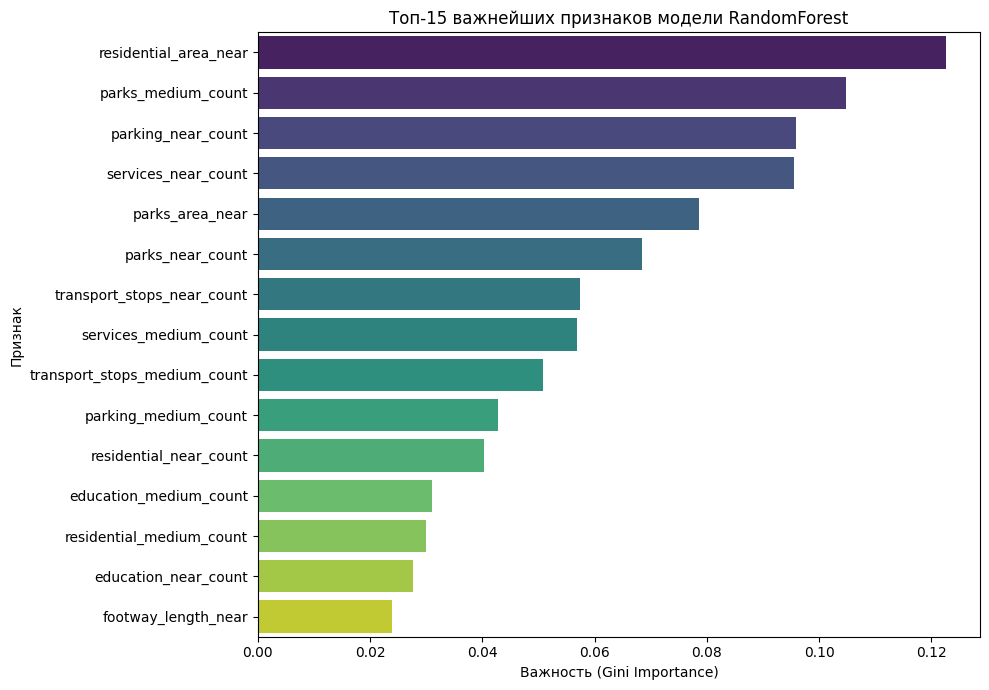

In [16]:
# Визуализация важности признаков
plt.figure(figsize=(10, 7))
top_features_rf = rf_feature_importance.head(15)
sns.barplot(data=top_features_rf, x='Важность', y='Признак', palette='viridis')
plt.title('Топ-15 важнейших признаков модели RandomForest')
plt.xlabel('Важность (Gini Importance)')
plt.ylabel('Признак')
plt.tight_layout()
plt.show()

In [17]:
# Инициализируем модель GradientBoostingClassifier
gb_model = GradientBoostingClassifier(
    n_estimators=100,       # Количество деревьев (этапов бустинга)
    learning_rate=0.1,      # Скорость обучения (влияет на вклад каждого дерева)
    max_depth=5,            # Максимальная глубина деревьев
    random_state=42
)

# Кросс-валидация для Gradient Boosting
print("Проведение кросс-валидации для GradientBoosting...")
cv_scores_gb = cross_val_score(gb_model, X_scaled, y, cv=5, scoring='roc_auc', n_jobs=-1)
print(f"  GradientBoosting CV ROC AUC: {cv_scores_gb.mean():.4f} ± {cv_scores_gb.std():.4f}")

Проведение кросс-валидации для GradientBoosting...
  GradientBoosting CV ROC AUC: 0.9591 ± 0.0135


In [18]:
# Обучаем модель на ОБУЧАЮЩЕЙ выборке
print("Обучение GradientBoosting на обучающей выборке...")
gb_model.fit(X_train, y_train)

# Предсказания на ТЕСТОВОЙ выборке
gb_preds = gb_model.predict(X_test)
gb_proba = gb_model.predict_proba(X_test)[:, 1]

# Оценка на ТЕСТОВОЙ выборке
gb_accuracy = accuracy_score(y_test, gb_preds)
gb_roc_auc = roc_auc_score(y_test, gb_proba)

print(f"  GradientBoosting Test Accuracy: {gb_accuracy:.4f}")
print(f"  GradientBoosting Test ROC AUC: {gb_roc_auc:.4f}")
print("\n  Отчет о классификации GradientBoosting (на тестовой выборке):")
print(classification_report(y_test, gb_preds, target_names=['Нет магазина', 'Есть магазин']))

Обучение GradientBoosting на обучающей выборке...
  GradientBoosting Test Accuracy: 0.8997
  GradientBoosting Test ROC AUC: 0.9680

  Отчет о классификации GradientBoosting (на тестовой выборке):
              precision    recall  f1-score   support

Нет магазина       0.92      0.94      0.93       239
Есть магазин       0.85      0.80      0.82       100

    accuracy                           0.90       339
   macro avg       0.88      0.87      0.88       339
weighted avg       0.90      0.90      0.90       339



In [19]:
# Важность признаков для Gradient Boosting
gb_feature_importance = pd.DataFrame({
    'Признак': model_feature_columns,
    'Важность': gb_model.feature_importances_
}).sort_values('Важность', ascending=False)

print("\n  Топ-15 важных признаков GradientBoosting:")
display(gb_feature_importance.head(15))


  Топ-15 важных признаков GradientBoosting:


,Признак,Важность
21,services_near_count,0.427213
2,residential_area_near,0.078941
23,parks_near_count,0.070019
4,transport_stops_medium_count,0.049603
25,parks_area_near,0.048197
7,parking_near_count,0.043893
29,footway_length_near,0.042125
0,residential_near_count,0.037047
1,residential_medium_count,0.035522
3,transport_stops_near_count,0.024627


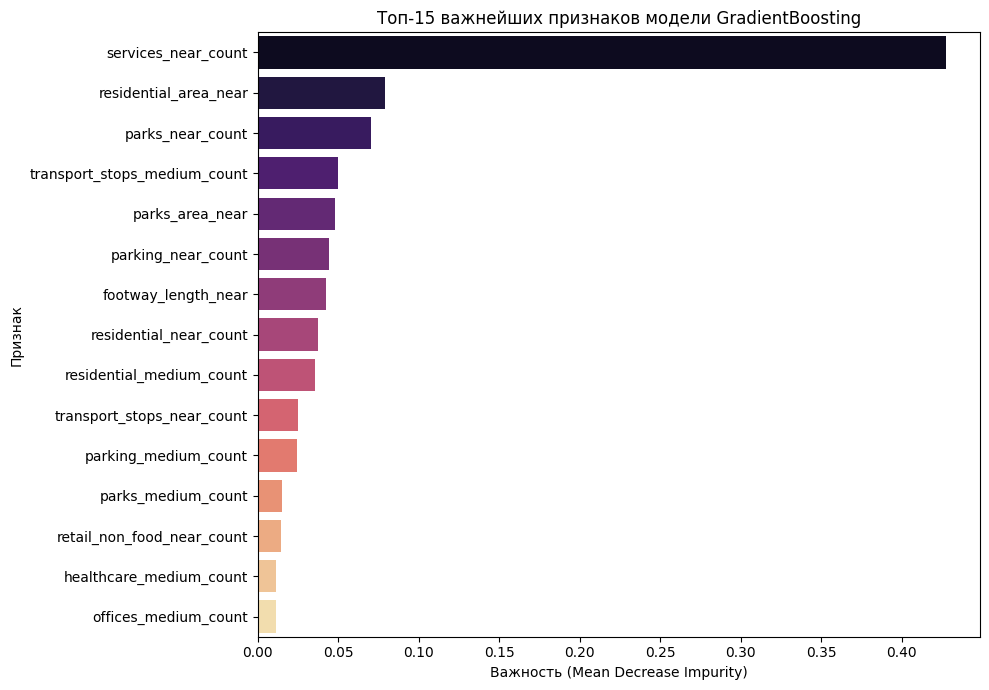

In [20]:
# Визуализация важности признаков
plt.figure(figsize=(10, 7))
top_features_gb = gb_feature_importance.head(15)
sns.barplot(data=top_features_gb, x='Важность', y='Признак', palette='magma')
plt.title('Топ-15 важнейших признаков модели GradientBoosting')
plt.xlabel('Важность (Mean Decrease Impurity)')
plt.ylabel('Признак')
plt.tight_layout()
plt.show()

In [21]:
# --- Шаг 3 (в рамках раздела 3): Сравнение моделей и выбор лучшей ---

# Сравниваем модели по ROC AUC на тестовой выборке
print("\n  Сравнение ROC AUC на тестовой выборке:")
models_comparison = pd.DataFrame({
    'Модель': ['RandomForest', 'GradientBoosting'],
    # Используем .get('gb_roc_auc', 0) на случай, если GB не обучился
    'ROC AUC (Test)': [rf_roc_auc, locals().get('gb_roc_auc', 0)],
    'ROC AUC (CV Mean)': [cv_scores_rf.mean(), cv_scores_gb.mean() if 'cv_scores_gb' in locals() else 0]
})
display(models_comparison.sort_values('ROC AUC (Test)', ascending=False))


  Сравнение ROC AUC на тестовой выборке:


,Модель,ROC AUC (Test),ROC AUC (CV Mean)
0,RandomForest,0.970544,0.962461
1,GradientBoosting,0.967992,0.959110


In [22]:
# Выбираем лучшую модель на основе ROC AUC на тестовой выборке
# (Можно также ориентироваться на CV ROC AUC для большей надежности)
current_best_roc_auc = 0
if 'gb_roc_auc' in locals() and gb_roc_auc > rf_roc_auc:
    best_model = gb_model
    best_model_name = "GradientBoosting"
    best_roc_auc = gb_roc_auc
    best_feature_importance = gb_feature_importance
    print(f"\n  Лучшая модель по Test ROC AUC: {best_model_name} ({best_roc_auc:.4f})")
else:
    best_model = rf_model
    best_model_name = "RandomForest"
    best_roc_auc = rf_roc_auc
    best_feature_importance = rf_feature_importance
    print(f"\n  Лучшая модель по Test ROC AUC: {best_model_name} ({best_roc_auc:.4f})")

print("\n  Важные признаки лучшей модели:")
display(best_feature_importance.head(10))


  Лучшая модель по Test ROC AUC: RandomForest (0.9705)

  Важные признаки лучшей модели:


,Признак,Важность
2,residential_area_near,0.122520
24,parks_medium_count,0.104758
7,parking_near_count,0.095811
21,services_near_count,0.095588
25,parks_area_near,0.078623
23,parks_near_count,0.068487
3,transport_stops_near_count,0.057388
22,services_medium_count,0.056864
4,transport_stops_medium_count,0.050707
8,parking_medium_count,0.042783


In [23]:
# Предсказываем ВЕРОЯТНОСТЬ привлекательности места расположения для ВСЕХ ячеек с помощью лучшей модели
print("\n  Предсказываем привлекательность места расположения для всех ячеек...")

# Используем predict_proba() для получения вероятности класса 1 (has_grocery_store=True)
# Применяем модель ко всем масштабированным данным X_scaled
environment_suitability_proba = best_model.predict_proba(X_scaled)[:, 1]

# Добавляем результат как новый столбец в GeoDataFrame
h3_gdf['environment_suitability'] = environment_suitability_proba

# Дополнительные метрики для анализа
print(f"\n  Статистика предсказанной привлекательности:")
print(f"    Минимальная вероятность: {environment_suitability_proba.min():.3f}")
print(f"    Максимальная вероятность: {environment_suitability_proba.max():.3f}")
print(f"    Средняя вероятность: {environment_suitability_proba.mean():.3f}")
print(f"    Медианная вероятность: {np.median(environment_suitability_proba):.3f}")

# Анализ распределения вероятностей
high_prob_threshold = 0.7
medium_prob_threshold = 0.3

high_prob_count = (environment_suitability_proba >= high_prob_threshold).sum()
medium_prob_count = ((environment_suitability_proba >= medium_prob_threshold) &
                     (environment_suitability_proba < high_prob_threshold)).sum()
low_prob_count = (environment_suitability_proba < medium_prob_threshold).sum()

print(f"\n  Распределение ячеек по уровню привлекательности:")
print(f"    Высокая привлекательность (≥{high_prob_threshold:.0%}): {high_prob_count} ячеек ({high_prob_count/len(h3_gdf):.1%})")
print(f"    Средняя привлекательность (≥{medium_prob_threshold:.0%}): {medium_prob_count} ячеек ({medium_prob_count/len(h3_gdf):.1%})")
print(f"    Низкая привлекательность (<{medium_prob_threshold:.0%}): {low_prob_count} ячеек ({low_prob_count/len(h3_gdf):.1%})")

# Сравнение с фактическим наличием магазинов
if 'has_grocery_store' in h3_gdf.columns:
    actual_with_stores = h3_gdf[h3_gdf['has_grocery_store']]
    actual_without_stores = h3_gdf[~h3_gdf['has_grocery_store']]

    print(f"\n  Сравнение с фактическими данными:")
    if len(actual_with_stores) > 0:
        print(f"    Средняя привлекательность в ячейках С магазинами: {actual_with_stores['environment_suitability'].mean():.3f}")
    if len(actual_without_stores) > 0:
        print(f"    Средняя привлекательность в ячейках БЕЗ магазинов: {actual_without_stores['environment_suitability'].mean():.3f}")

# Анализ пищевых пустынь с высокой привлекательностью
if 'is_food_desert_target' in h3_gdf.columns:
    high_potential_food_deserts = h3_gdf[
        (h3_gdf['is_food_desert_target'] == 1) &
        (h3_gdf['environment_suitability'] >= high_prob_threshold)
    ]

    if len(high_potential_food_deserts) > 0:
        print(f"\n  🎯 ОБНАРУЖЕНЫ ПЕРСПЕКТИВНЫЕ ПИЩЕВЫЕ ПУСТЫНИ:")
        print(f"    Найдено {len(high_potential_food_deserts)} ячеек с высокой привлекательностью, но без магазинов")

        # Анализ характеристик перспективных пищевых пустынь
        if len(high_potential_food_deserts) > 0:
            top_potential = high_potential_food_deserts.nlargest(5, 'environment_suitability')
            print(f"\n    Топ-5 самых перспективных пищевых пустынь:")
            for idx, row in top_potential.iterrows():
                print(f"      H3: {row['h3_index']} - вероятность: {row['environment_suitability']:.3f}")

# Создаем категории привлекательности для визуализации
def categorize_suitability(prob):
    if prob >= high_prob_threshold:
        return 'Высокая'
    elif prob >= medium_prob_threshold:
        return 'Средняя'
    else:
        return 'Низкая'

h3_gdf['suitability_category'] = h3_gdf['environment_suitability'].apply(categorize_suitability)

print(f"\n  Столбец 'environment_suitability' добавлен в h3_gdf.")
print(f"  Столбец 'suitability_category' добавлен для категоризации.")

# Показываем примеры результатов
print("\n  Примеры предсказаний для разных категорий:")
display(h3_gdf[['h3_index', 'has_grocery_store', 'environment_suitability', 'suitability_category']].head(10))

# Дополнительно: показываем распределение по категориям
category_counts = h3_gdf['suitability_category'].value_counts()
print(f"\n  Распределение по категориям привлекательности:")
for category, count in category_counts.items():
    print(f"    {category}: {count} ячеек ({count/len(h3_gdf):.1%})")


  Предсказываем привлекательность места расположения для всех ячеек...

  Статистика предсказанной привлекательности:
    Минимальная вероятность: 0.002
    Максимальная вероятность: 1.000
    Средняя вероятность: 0.336
    Медианная вероятность: 0.151

  Распределение ячеек по уровню привлекательности:
    Высокая привлекательность (≥70%): 333 ячеек (24.6%)
    Средняя привлекательность (≥30%): 222 ячеек (16.4%)
    Низкая привлекательность (<30%): 800 ячеек (59.0%)

  Сравнение с фактическими данными:
    Средняя привлекательность в ячейках С магазинами: 0.828
    Средняя привлекательность в ячейках БЕЗ магазинов: 0.130

  🎯 ОБНАРУЖЕНЫ ПЕРСПЕКТИВНЫЕ ПИЩЕВЫЕ ПУСТЫНИ:
    Найдено 13 ячеек с высокой привлекательностью, но без магазинов

    Топ-5 самых перспективных пищевых пустынь:
      H3: 8911aa46923ffff - вероятность: 0.958
      H3: 8911aa09a87ffff - вероятность: 0.832
      H3: 8911aa72447ffff - вероятность: 0.817
      H3: 8911aa0b52bffff - вероятность: 0.785
      H3: 8911aa09

,h3_index,has_grocery_store,environment_suitability,suitability_category
0,8911aa08023ffff,False,0.002379,Низкая
1,8911aa46d33ffff,False,0.064761,Низкая
2,8911aa090dbffff,False,0.033812,Низкая
3,8911aa08377ffff,False,0.002570,Низкая
4,8911aa0b273ffff,False,0.025534,Низкая
5,8911aa09597ffff,False,0.012044,Низкая
6,8911aa08007ffff,False,0.002379,Низкая
7,8911aa0843bffff,False,0.002379,Низкая
8,8911aa09edbffff,True,0.434084,Средняя
9,8911aa09893ffff,False,0.370280,Средняя



  Распределение по категориям привлекательности:
    Низкая: 800 ячеек (59.0%)
    Высокая: 333 ячеек (24.6%)
    Средняя: 222 ячеек (16.4%)


### **3.5. Пояснение**



*   Мы разделили данные на обучающую и тестовую выборки, сохраняя баланс классов.
*   Обучили две модели – RandomForest и GradientBoosting, предварительно оценив их потенциальную производительность с помощью кросс-валидации.
*   Оценили качество моделей на отложенной тестовой выборке по метрикам Accuracy, ROC AUC и с помощью Classification Report. ROC AUC является целевой метрикой для сравнения.
*   Проанализировали важность признаков для обеих моделей. Это дает ценную информацию о том, какие характеристики локации (например, близость офисов, магазинов, остановок, плотность жилой застройки) наиболее сильно связаны с присутствием кофеен в данной области. Списки топ-признаков у RF и GB могут немного отличаться, но часто пересекаются.
*   Выбрали лучшую модель на основе ROC AUC на тестовой выборке.
*   Используя лучшую модель, мы рассчитали **вероятность привлекательности места расположения (`environment_suitability`)** для *каждой* ячейки H3 в нашем ROI. Это значение от 0 до 1, где 1 означает максимальную схожесть места расположения с теми местами, где уже существуют кофейни (по мнению модели).



**Вывод по разделу:** Мы обучили несколько моделей и выбрали лучшую модель машинного обучения, которая научилась по характеристикам окружения предсказывать вероятность того, что среда в данной ячейке H3 является привлекательной для открытия кофейни. Мы также определили наиболее значимые признаки этой "привлекательности".

## **Раздел 4. Улучшение модели с помощью кластеризации**


### **4.1. Кластеризация K-Means для выявления паттернов**


Иногда в данных существуют скрытые группы (кластеры) ячеек со схожими характеристиками, которые не очевидны для основной модели классификации. Добавление информации о принадлежности ячейки к тому или иному кластеру может улучшить качество предсказаний.

*   **K-Means:** Алгоритм кластеризации, который делит данные на K заранее заданных кластеров, минимизируя суммарное квадратичное отклонение точек от центров их кластеров (WCSS - Within-Cluster Sum of Squares).
*   **Метод локтя (Elbow Method):** Способ выбора оптимального числа кластеров K. Строится график зависимости WCSS от K. Оптимальным считается значение K в точке "изгиба" графика ("локоть"), после которой добавление новых кластеров уже не дает существенного уменьшения WCSS. Библиотека `kneed` помогает найти эту точку автоматически.
*   **PCA (Principal Component Analysis):** Метод снижения размерности. Мы используем его здесь не для моделирования, а для **визуализации** кластеров. Он преобразует многомерные данные в 2-3 измерения (главные компоненты), сохраняя при этом максимальное количество информации (дисперсии), что позволяет отобразить кластеры на плоскости.
*   **One-Hot Encoding (OHE):** Преобразование категориального признака (номер кластера) в набор бинарных признаков (0/1), по одному на каждый кластер. Это стандартный способ использования категориальных признаков в большинстве моделей ML.

**Идея:**
1.  Кластеризовать ячейки H3 на основе их масштабированных признаков места расположения (`X_scaled`).
2.  Создать новые бинарные признаки, указывающие на принадлежность ячейки к каждому кластеру.
3.  Добавить эти новые признаки к исходным (`X_scaled`).
4.  Переобучить нашу лучшую модель (RF или GB) на расширенном наборе признаков.
5.  Сравнить качество новой модели с исходной. Если есть *значительное* улучшение (например, ROC AUC вырос более чем на 0.01-0.05), использовать улучшенную модель. В противном случае, остаться с более простой исходной моделью.

### **4.2. Код: Определение K, кластеризация, PCA, OHE, переобучение модели**

  1. Определение оптимального K (метод локтя)...
    Оптимальное K найдено: 7


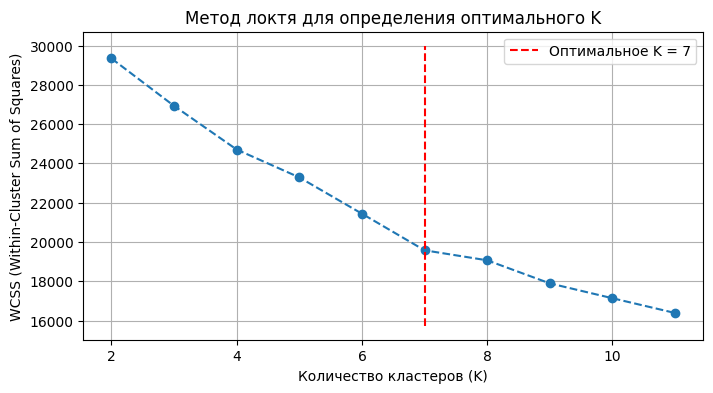

In [24]:
# 1. Определяем оптимальное K с помощью метода локтя
print("  1. Определение оптимального K (метод локтя)...")
k_range = range(2, 12) # Диапазон K для проверки
wcss = [] # Список для хранения WCSS для каждого K
for k in k_range:
    kmeans = KMeans(n_clusters=k, init='k-means++', max_iter=300, n_init='auto', random_state=42)
    kmeans.fit(X_scaled)
    wcss.append(kmeans.inertia_) # inertia_ атрибут содержит WCSS

# Визуализация метода локтя
plt.figure(figsize=(8, 4))
plt.plot(list(k_range), wcss, marker='o', linestyle='--')
plt.xlabel('Количество кластеров (K)')
plt.ylabel('WCSS (Within-Cluster Sum of Squares)')
plt.title('Метод локтя для определения оптимального K')
plt.grid(True)


# Автоматическое определение локтя с помощью kneed
# curve='convex', direction='decreasing' - базовые параметры для WCSS графика
try:
    kl = KneeLocator(list(k_range), wcss, curve='convex', direction='decreasing')
    optimal_k = kl.elbow
    if optimal_k is None: # Если локоть не найден автоматически
        print("    Локоть не найден автоматически, используем K=5 по умолчанию.")
        optimal_k = 5
    else:
        print(f"    Оптимальное K найдено: {optimal_k}")
        # Отмечаем найденный локоть на графике
        plt.vlines(optimal_k, plt.ylim()[0], plt.ylim()[1], linestyles='dashed', color='r', label=f'Оптимальное K = {optimal_k}')
        plt.legend()
except Exception as e:
    print(f"    Ошибка при поиске локтя ({e}), используем K=5 по умолчанию.")
    optimal_k = 5

plt.show()

In [25]:
# 2. Обучаем KMeans с оптимальным K и получаем метки кластеров
print(f"  2. Обучение KMeans (K={optimal_k})...")
kmeans_final = KMeans(n_clusters=optimal_k, init='k-means++', max_iter=300, n_init='auto', random_state=42)
cluster_labels = kmeans_final.fit_predict(X_scaled) # Получаем номер кластера для каждой ячейки
h3_gdf['cluster_label'] = cluster_labels # Добавляем метки в GeoDataFrame (для анализа)
print(f"    Ячейки распределены по {optimal_k} кластерам.")
print(f"    Распределение по кластерам:\n{pd.Series(cluster_labels).value_counts().sort_index()}")

  2. Обучение KMeans (K=7)...
    Ячейки распределены по 7 кластерам.
    Распределение по кластерам:
0     84
1    186
2    177
3     41
4    851
5      7
6      9
Name: count, dtype: int64


  2.5. PCA-визуализация кластеров...


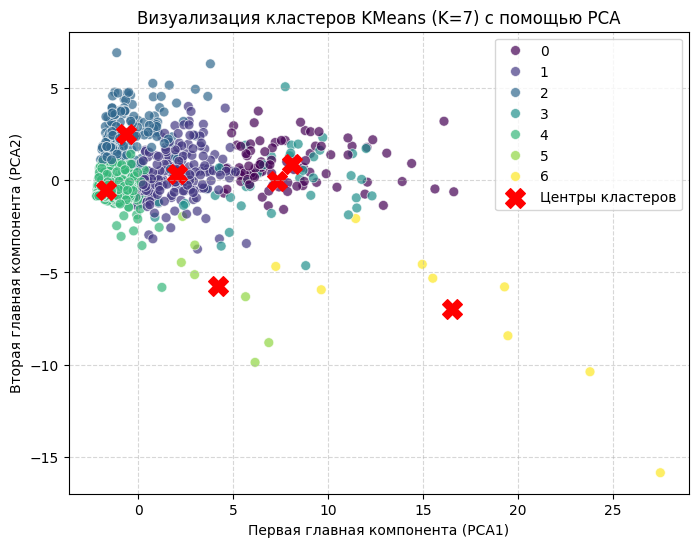

In [26]:
# 2.5. Визуализация кластеров через PCA (для понимания)
print("  2.5. PCA-визуализация кластеров...")
pca = PCA(n_components=2, random_state=42) # Создаем PCA для 2 компонент
X_pca = pca.fit_transform(X_scaled) # Применяем PCA к масштабированным данным

plt.figure(figsize=(8, 6))
# Строим диаграмму рассеяния точек в пространстве 2 главных компонент, раскрашивая по кластерам
sns.scatterplot(x=X_pca[:, 0], y=X_pca[:, 1], hue=cluster_labels, palette='viridis', s=50, alpha=0.7, legend='full')
# Отображаем центры кластеров, также преобразованные PCA
centers_pca = pca.transform(kmeans_final.cluster_centers_)
plt.scatter(centers_pca[:, 0], centers_pca[:, 1], marker='X', s=200, c='red', label='Центры кластеров')
plt.xlabel('Первая главная компонента (PCA1)')
plt.ylabel('Вторая главная компонента (PCA2)')
plt.title(f'Визуализация кластеров KMeans (K={optimal_k}) с помощью PCA')
plt.legend()
plt.grid(True, linestyle='--', alpha=0.5)
plt.show()

In [27]:
# 3. One-Hot Encoding кластерных меток
print("  3. One-Hot Encoding кластеров...")
ohe = OneHotEncoder(sparse_output=False, handle_unknown='ignore') # sparse=False возвращает плотный массив NumPy
# Преобразуем метки кластеров (вектор-столбец) в матрицу бинарных признаков
cluster_dummies = ohe.fit_transform(cluster_labels.reshape(-1, 1))
# Создаем имена для новых признаков
cluster_names = [f"Cluster_{i}" for i in range(cluster_dummies.shape[1])]
print(f"    Создано {len(cluster_names)} бинарных кластерных признаков.")

  3. One-Hot Encoding кластеров...
    Создано 7 бинарных кластерных признаков.


In [28]:
# 4. Объединяем исходные масштабированные признаки с кластерными
# np.concatenate соединяет массивы по указанной оси (axis=1 - по столбцам)
X_with_cluster = np.concatenate([X_scaled, cluster_dummies], axis=1)
# Обновляем список имен всех признаков
features_with_cluster = model_feature_columns + cluster_names
print(f"    Общее количество признаков с учетом кластеров: {X_with_cluster.shape[1]}")

    Общее количество признаков с учетом кластеров: 39


In [29]:
# 5. Переобучаем ЛУЧШУЮ модель (выбранную ранее) с новыми признаками
print(f"  5. Переобучение модели {best_model_name} с кластерными признаками...")
# Используем то же разделение train/test, что и раньше, но с новыми данными X_with_cluster
X_tr_clu, X_te_clu, y_tr_clu, y_te_clu = train_test_split(
    X_with_cluster, y, test_size=0.25, random_state=42, stratify=y
)

# Создаем новую модель того же типа с теми же параметрами, что и лучшая модель
if best_model_name == "RandomForest":
    params = rf_model.get_params() # Получаем параметры исходной RF модели
    model_cluster = RandomForestClassifier(**params) # Создаем новую RF с теми же параметрами
elif best_model_name == "GradientBoosting":
    params = gb_model.get_params() # Получаем параметры исходной GB модели
    model_cluster = GradientBoostingClassifier(**params) # Создаем новую GB с теми же параметрами
else: # На случай, если best_model_name не определен (хотя не должен)
    print("    Предупреждение: Не удалось определить тип лучшей модели, используется RandomForest по умолчанию.")
    model_cluster = RandomForestClassifier(random_state=42, class_weight='balanced')

# Обучаем новую модель на расширенных данных
model_cluster.fit(X_tr_clu, y_tr_clu)
# Оцениваем ROC AUC на тестовой выборке с расширенными признаками
roc_cluster = roc_auc_score(y_te_clu, model_cluster.predict_proba(X_te_clu)[:, 1])
print(f"    ROC AUC исходной модели ({best_model_name}): {best_roc_auc:.4f}")
print(f"    ROC AUC модели с кластерами: {roc_cluster:.4f}")

  5. Переобучение модели RandomForest с кластерными признаками...
    ROC AUC исходной модели (RandomForest): 0.9705
    ROC AUC модели с кластерами: 0.9692


In [30]:
# 6. Обновляем модель, если улучшение ROC AUC ЗНАЧИТЕЛЬНОЕ
improvement_threshold = 0.01 # Порог улучшения ROC AUC (можно настроить)
if (roc_cluster - best_roc_auc) > improvement_threshold:
    print(f"  >>> Улучшение ROC AUC ({roc_cluster - best_roc_auc:.4f}) > порога ({improvement_threshold}). Принимаем модель с кластерами.")
    # Обновляем лучшую модель, ее имя, ROC AUC и данные для предсказания
    best_model = model_cluster
    best_model_name = best_model_name + "_with_Clusters"
    best_roc_auc = roc_cluster
    # Пересчитываем 'environment_suitability' с использованием улучшенной модели и расширенных признаков
    h3_gdf['environment_suitability'] = best_model.predict_proba(X_with_cluster)[:, 1]
    print(f"    Столбец 'environment_suitability' обновлен с учетом кластеров.")
else:
    print(f"  Улучшение ROC AUC ({(roc_cluster - best_roc_auc):.4f}) меньше порога ({improvement_threshold}). Используем исходную модель без кластеров.")
    # Ничего не меняем, оставляем исходную best_model и environment_suitability

  Улучшение ROC AUC (-0.0013) меньше порога (0.01). Используем исходную модель без кластеров.


### **4.3. Пояснение**



*   Мы использовали метод локтя для выбора оптимального числа кластеров K.
*   Обучили модель KMeans и получили метки кластеров для каждой ячейки H3.
*   Визуализировали кластеры с помощью PCA, чтобы получить представление об их разделении в пространстве признаков.
*   Преобразовали метки кластеров в бинарные признаки с помощью One-Hot Encoding.
*   Объединили исходные признаки с новыми кластерными признаками.
*   Переобучили лучшую модель (выбранную на шаге 3.4) на этом расширенном наборе данных.
*   Сравнили ROC AUC новой модели с ROC AUC исходной модели. В данном случае, мы установили порог улучшения в 0.01. Если улучшение превышает порог, мы обновляем нашу `best_model` и пересчитываем `environment_suitability`. Если нет – оставляем исходную модель, так как добавление кластерных признаков не дало значимого прироста качества и только усложнило бы модель.



**Вывод по разделу:** Кластеризация может быть полезным инструментом для выявления скрытых структур в данных и потенциального улучшения основной модели. Однако важно оценивать, дает ли это *значимое* улучшение, чтобы избежать излишнего усложнения анализа. В нашем случае, код принимает решение автоматически на основе заданного порога.

## **Раздел 5. Расчет итогового потенциала локации**


### **5.1. Интегральная оценка потенциала (привлекательность места расположения vs конкуренция)**


До сих пор мы моделировали только **привлекательность места расположения (`environment_suitability`)**, основываясь на инфраструктуре и игнорируя существующих конкурентов. Однако для оценки **потенциала открытия новой кофейни** необходимо учесть оба фактора:

1.  **Привлекательность места расположения:** Насколько окружение похоже на места, где кофейни уже успешно работают (оценено нашей ML моделью).
2.  **Уровень конкуренции:** Сколько кофеен уже есть поблизости. Высокая конкуренция снижает потенциал новой точки.

Мы рассчитаем итоговый **потенциал открытия (`opening_potential`)** как взвешенную сумму этих двух компонентов:

- `opening_potential = W_env * environment_suitability + W_comp * (1 - normalized_competition)`

Где:

*   `environment_suitability`: Рассчитанная ранее вероятность привлекательности места расположения (от 0 до 1).
*   `normalized_competition`: Уровень конкуренции, нормализованный к диапазону от 0 до 1. Мы используем количество конкурентов в *среднем* радиусе (`coffee_shops_medium_count`), деленное на максимальное количество конкурентов в среднем радиусе по всей территории (`max_competitors`). `(1 - normalized_competition)` дает "свободу от конкуренции" (1 - нет конкурентов, 0 - максимальная конкуренция).
*   `W_env`, `W_comp`: Веса, определяющие относительную важность привлекательности места расположения и отсутствия конкуренции. Сумма весов должна быть равна 1 (например, `W_env = 0.7`, `W_comp = 0.3`). Выбор весов зависит от бизнес-стратегии (что важнее: идеальное место с конкурентами или менее идеальное, но без них?).

**Категоризация потенциала:** Для удобства интерпретации и визуализации мы разделим непрерывное значение `opening_potential` на несколько категорий (например, "Низкий", "Средний", "Высокий") с помощью квантилей. Квантили делят распределение данных на равные части (например, 5 квантилей делят данные на 5 групп по 20% ячеек в каждой).

### **5.2. Расчет и категоризация потенциала**

In [31]:
# --- Шаг 6: Расчет потенциала для открытия продуктового магазина ---

print("\nШаг 6: Расчет потенциала для открытия продуктового магазина...")

# Находим максимальное количество конкурентов в среднем радиусе для нормализации
# Добавляем 1, чтобы избежать деления на ноль, если конкурентов нигде нет
max_competitors = h3_gdf['competitors_medium_count'].max()
if max_competitors == 0:
    max_competitors = 1  # Избегаем деления на ноль

print(f"  Максимальное количество конкурентов в среднем радиусе: {max_competitors}")

# Рассчитываем потенциал открытия магазина
# Формула: Привлекательность локации * (1 - Нормализованная конкуренция)
h3_gdf['open_potential'] = h3_gdf['environment_suitability'] * (
    1 - (h3_gdf['competitors_medium_count'] / (max_competitors + 1))
)

# Дополнительные метрики потенциала
print(f"\n  Статистика потенциала открытия:")
print(f"    Минимальный потенциал: {h3_gdf['open_potential'].min():.3f}")
print(f"    Максимальный потенциал: {h3_gdf['open_potential'].max():.3f}")
print(f"    Средний потенциал: {h3_gdf['open_potential'].mean():.3f}")

# Анализ распределения потенциала
high_potential_threshold = 0.6
medium_potential_threshold = 0.3

high_potential = h3_gdf[h3_gdf['open_potential'] >= high_potential_threshold]
medium_potential = h3_gdf[(h3_gdf['open_potential'] >= medium_potential_threshold) &
                         (h3_gdf['open_potential'] < high_potential_threshold)]
low_potential = h3_gdf[h3_gdf['open_potential'] < medium_potential_threshold]

print(f"\n  Распределение ячеек по потенциалу открытия:")
print(f"    Высокий потенциал (≥{high_potential_threshold:.0%}): {len(high_potential)} ячеек ({len(high_potential)/len(h3_gdf):.1%})")
print(f"    Средний потенциал (≥{medium_potential_threshold:.0%}): {len(medium_potential)} ячеек ({len(medium_potential)/len(h3_gdf):.1%})")
print(f"    Низкий потенциал (<{medium_potential_threshold:.0%}): {len(low_potential)} ячеек ({len(low_potential)/len(h3_gdf):.1%})")

# Анализ лучших локаций
if len(high_potential) > 0:
    top_locations = high_potential.nlargest(10, 'open_potential')
    print(f"\n  Топ-10 локаций с наивысшим потенциалом:")
    for idx, row in top_locations.iterrows():
        print(f"    H3: {row['h3_index']} - потенциал: {row['open_potential']:.3f}, "
              f"конкуренты: {row['competitors_medium_count']}, "
              f"привлекательность: {row['environment_suitability']:.3f}")

# Дополнительные аналитические метрики для продуктовых магазинов

# 1. Анализ "идеальных" локаций (высокая привлекательность + низкая конкуренция)
ideal_locations = h3_gdf[
    (h3_gdf['environment_suitability'] >= 0.7) &
    (h3_gdf['competitors_medium_count'] <= 1)
]

if len(ideal_locations) > 0:
    print(f"\n  🏆 ОБНАРУЖЕНЫ ИДЕАЛЬНЫЕ ЛОКАЦИИ:")
    print(f"    Найдено {len(ideal_locations)} ячеек с высокой привлекательностью и минимальной конкуренцией")

    # Анализ характеристик идеальных локаций
    ideal_stats = ideal_locations[['residential_near_count', 'education_near_count',
                                  'transport_stops_near_count', 'open_potential']].describe()
    print(f"    Характеристики идеальных локаций:")
    print(f"      Медианное количество жилых объектов: {ideal_locations['residential_near_count'].median():.0f}")
    print(f"      Медианное количество образовательных учреждений: {ideal_locations['education_near_count'].median():.0f}")
    print(f"      Медианное количество остановок транспорта: {ideal_locations['transport_stops_near_count'].median():.0f}")

# 2. Анализ локаций с высокой плотностью населения и низкой конкуренцией
if 'residential_near_count' in h3_gdf.columns:
    residential_threshold = h3_gdf['residential_near_count'].quantile(0.7)  # Верхние 30%
    high_density_low_competition = h3_gdf[
        (h3_gdf['residential_near_count'] >= residential_threshold) &
        (h3_gdf['competitors_medium_count'] <= 1) &
        (h3_gdf['open_potential'] >= medium_potential_threshold)
    ]

    if len(high_density_low_competition) > 0:
        print(f"\n  📊 ЛОКАЦИИ С ВЫСОКОЙ ПЛОТНОСТЬЮ НАСЕЛЕНИЯ И НИЗКОЙ КОНКУРЕНЦИЕЙ:")
        print(f"    Найдено {len(high_density_low_competition)} перспективных ячеек")
        print(f"    Средний потенциал: {high_density_low_competition['open_potential'].mean():.3f}")

# 3. Категоризация потенциала для визуализации
def categorize_potential(potential):
    if potential >= high_potential_threshold:
        return 'Высокий'
    elif potential >= medium_potential_threshold:
        return 'Средний'
    else:
        return 'Низкий'

h3_gdf['potential_category'] = h3_gdf['open_potential'].apply(categorize_potential)

print(f"\n  Столбец 'open_potential' добавлен в h3_gdf.")
print(f"  Столбец 'potential_category' добавлен для категоризации.")

# Показываем примеры результатов
print("\n  Примеры расчета потенциала:")
display(h3_gdf[['h3_index', 'environment_suitability', 'competitors_medium_count',
                'open_potential', 'potential_category']].head(10))

# Сохранение ключевых метрик для отчета
potential_analysis = {
    'total_cells': len(h3_gdf),
    'high_potential_count': len(high_potential),
    'medium_potential_count': len(medium_potential),
    'low_potential_count': len(low_potential),
    'ideal_locations_count': len(ideal_locations) if 'ideal_locations' in locals() else 0,
    'max_potential': h3_gdf['open_potential'].max(),
    'avg_potential': h3_gdf['open_potential'].mean()
}

print(f"\n  Анализ потенциала завершен!")
print(f"  Рекомендуется рассмотреть {len(high_potential)} ячеек с высоким потенциалом для открытия магазинов")


Шаг 6: Расчет потенциала для открытия продуктового магазина...
  Максимальное количество конкурентов в среднем радиусе: 29

  Статистика потенциала открытия:
    Минимальный потенциал: 0.002
    Максимальный потенциал: 0.915
    Средний потенциал: 0.278

  Распределение ячеек по потенциалу открытия:
    Высокий потенциал (≥60%): 301 ячеек (22.2%)
    Средний потенциал (≥30%): 242 ячеек (17.9%)
    Низкий потенциал (<30%): 812 ячеек (59.9%)

  Топ-10 локаций с наивысшим потенциалом:
    H3: 8911aa09e3bffff - потенциал: 0.915, конкуренты: 2, привлекательность: 0.981
    H3: 8911aa46923ffff - потенциал: 0.894, конкуренты: 2, привлекательность: 0.958
    H3: 8911aa4693bffff - потенциал: 0.882, конкуренты: 2, привлекательность: 0.945
    H3: 8911aa09bd7ffff - потенциал: 0.874, конкуренты: 2, привлекательность: 0.936
    H3: 8911aa7344fffff - потенциал: 0.872, конкуренты: 3, привлекательность: 0.969
    H3: 8911aa73697ffff - потенциал: 0.870, конкуренты: 2, привлекательность: 0.933
    H3: 

,h3_index,environment_suitability,competitors_medium_count,open_potential,potential_category
0,8911aa08023ffff,0.002379,0,0.002379,Низкий
1,8911aa46d33ffff,0.064761,0,0.064761,Низкий
2,8911aa090dbffff,0.033812,0,0.033812,Низкий
3,8911aa08377ffff,0.002570,0,0.002570,Низкий
4,8911aa0b273ffff,0.025534,0,0.025534,Низкий
5,8911aa09597ffff,0.012044,1,0.011643,Низкий
6,8911aa08007ffff,0.002379,0,0.002379,Низкий
7,8911aa0843bffff,0.002379,0,0.002379,Низкий
8,8911aa09edbffff,0.434084,1,0.419615,Средний
9,8911aa09893ffff,0.370280,2,0.345595,Средний



  Анализ потенциала завершен!
  Рекомендуется рассмотреть 301 ячеек с высоким потенциалом для открытия магазинов


In [32]:
# Настраиваемые веса для компонентов потенциала (сумма должна быть = 1)
ENV_WEIGHT = 0.7       # Вес привлекательности места расположения
COMPETITION_WEIGHT = 0.3  # Вес фактора (отсутствия) конкуренции

In [33]:
# Рассчитываем нормализованный показатель конкуренции для продуктовых магазинов
h3_gdf['normalized_competition'] = h3_gdf['competitors_medium_count'] / max_competitors

# Определяем веса для факторов (можно настроить под конкретные требования)
ENV_WEIGHT = 0.6      # Вес привлекательности локации
COMPETITION_WEIGHT = 0.4  # Вес уровня конкуренции

# Формула потенциала открытия нового продуктового магазина
h3_gdf['opening_potential'] = (
    ENV_WEIGHT * h3_gdf['environment_suitability'] +
    COMPETITION_WEIGHT * (1 - h3_gdf['normalized_competition'])
)

# Убеждаемся, что потенциал находится в пределах от 0 до 1
h3_gdf['opening_potential'] = h3_gdf['opening_potential'].clip(0, 1)

print(f"  Рассчитан 'opening_potential' с весами: Локация={ENV_WEIGHT}, Конкуренция={COMPETITION_WEIGHT}")

# Анализ результатов расчета
print(f"\n  Статистика потенциала открытия:")
print(f"    Минимальный потенциал: {h3_gdf['opening_potential'].min():.3f}")
print(f"    Максимальный потенциал: {h3_gdf['opening_potential'].max():.3f}")
print(f"    Средний потенциал: {h3_gdf['opening_potential'].mean():.3f}")

# Сравнение с предыдущей формулой (если был расчет 'open_potential')
if 'open_potential' in h3_gdf.columns:
    correlation = h3_gdf['opening_potential'].corr(h3_gdf['open_potential'])
    print(f"    Корреляция с предыдущей формулой: {correlation:.3f}")

# Анализ лучших локаций по новой формуле
high_potential_locations = h3_gdf[h3_gdf['opening_potential'] >= 0.7]

if len(high_potential_locations) > 0:
    print(f"\n  Топ-5 локаций с наивысшим потенциалом (взвешенная формула):")
    top_locations = high_potential_locations.nlargest(5, 'opening_potential')
    for idx, row in top_locations.iterrows():
        print(f"    H3: {row['h3_index']} - потенциал: {row['opening_potential']:.3f}, "
              f"привлекательность: {row['environment_suitability']:.3f}, "
              f"конкуренция: {row['competitors_medium_count']} (норм.: {row['normalized_competition']:.3f})")

# Дополнительный анализ: разбивка по компонентам формулы
print(f"\n  Анализ компонентов формулы:")
high_potential_samples = h3_gdf.nlargest(3, 'opening_potential')
for idx, row in high_potential_samples.iterrows():
    env_component = ENV_WEIGHT * row['environment_suitability']
    comp_component = COMPETITION_WEIGHT * (1 - row['normalized_competition'])
    print(f"    H3: {row['h3_index']}")
    print(f"      Привлекательность: {row['environment_suitability']:.3f} * {ENV_WEIGHT} = {env_component:.3f}")
    print(f"      Конкуренция: (1 - {row['normalized_competition']:.3f}) * {COMPETITION_WEIGHT} = {comp_component:.3f}")
    print(f"      Итого: {row['opening_potential']:.3f}")

# Категоризация для визуализации
def categorize_opening_potential(potential):
    if potential >= 0.7:
        return 'Очень высокий'
    elif potential >= 0.5:
        return 'Высокий'
    elif potential >= 0.3:
        return 'Средний'
    else:
        return 'Низкий'

h3_gdf['opening_potential_category'] = h3_gdf['opening_potential'].apply(categorize_opening_potential)

# Статистика по категориям
category_stats = h3_gdf['opening_potential_category'].value_counts()
print(f"\n  Распределение по категориям потенциала:")
for category, count in category_stats.items():
    percentage = count / len(h3_gdf) * 100
    print(f"    {category}: {count} ячеек ({percentage:.1f}%)")

# Показываем примеры результатов
print("\n  Примеры расчета потенциала (взвешенная формула):")
display(h3_gdf[['h3_index', 'environment_suitability', 'competitors_medium_count',
                'normalized_competition', 'opening_potential', 'opening_potential_category']].head(10))

# Дополнительно: анализ чувствительности к весам (опционально)
def analyze_weight_sensitivity(gdf, base_env_weight=0.6, base_comp_weight=0.4):
    """Анализ чувствительности результатов к изменению весов"""
    print(f"\n  Анализ чувствительности к весам:")

    # Тестируем разные комбинации весов
    weight_combinations = [
        (0.8, 0.2),  # Больший вес привлекательности
        (0.6, 0.4),  # Баланс
        (0.4, 0.6),  # Больший вес конкуренции
        (0.5, 0.5),  # Равные веса
    ]

    base_potential = gdf['opening_potential']

    for env_weight, comp_weight in weight_combinations:
        temp_potential = (env_weight * gdf['environment_suitability'] +
                         comp_weight * (1 - gdf['normalized_competition'])).clip(0, 1)

        correlation = base_potential.corr(temp_potential)
        high_potential_count = (temp_potential >= 0.7).sum()

        print(f"    Веса ({env_weight}/{comp_weight}): "
              f"корр. = {correlation:.3f}, "
              f"высокий потенциал = {high_potential_count} ячеек")

# Запускаем анализ чувствительности
analyze_weight_sensitivity(h3_gdf)

print(f"\n  Расчет потенциала открытия завершен!")
print(f"  Рекомендуется рассмотреть {len(high_potential_locations)} ячеек с высоким потенциалом")

  Рассчитан 'opening_potential' с весами: Локация=0.6, Конкуренция=0.4

  Статистика потенциала открытия:
    Минимальный потенциал: 0.388
    Максимальный потенциал: 0.961
    Средний потенциал: 0.573
    Корреляция с предыдущей формулой: 0.993

  Топ-5 локаций с наивысшим потенциалом (взвешенная формула):
    H3: 8911aa09e3bffff - потенциал: 0.961, привлекательность: 0.981, конкуренция: 2 (норм.: 0.069)
    H3: 8911aa46923ffff - потенциал: 0.947, привлекательность: 0.958, конкуренция: 2 (норм.: 0.069)
    H3: 8911aa0999bffff - потенциал: 0.943, привлекательность: 0.997, конкуренция: 4 (норм.: 0.138)
    H3: 8911aa09c7bffff - потенциал: 0.942, привлекательность: 0.996, конкуренция: 4 (норм.: 0.138)
    H3: 8911aa098c7ffff - потенциал: 0.941, привлекательность: 0.993, конкуренция: 4 (норм.: 0.138)

  Анализ компонентов формулы:
    H3: 8911aa09e3bffff
      Привлекательность: 0.981 * 0.6 = 0.588
      Конкуренция: (1 - 0.069) * 0.4 = 0.372
      Итого: 0.961
    H3: 8911aa46923ffff
   

,h3_index,environment_suitability,competitors_medium_count,normalized_competition,opening_potential,opening_potential_category
0,8911aa08023ffff,0.002379,0,0.000000,0.401428,Средний
1,8911aa46d33ffff,0.064761,0,0.000000,0.438856,Средний
2,8911aa090dbffff,0.033812,0,0.000000,0.420287,Средний
3,8911aa08377ffff,0.002570,0,0.000000,0.401542,Средний
4,8911aa0b273ffff,0.025534,0,0.000000,0.415320,Средний
5,8911aa09597ffff,0.012044,1,0.034483,0.393434,Средний
6,8911aa08007ffff,0.002379,0,0.000000,0.401428,Средний
7,8911aa0843bffff,0.002379,0,0.000000,0.401428,Средний
8,8911aa09edbffff,0.434084,1,0.034483,0.646657,Высокий
9,8911aa09893ffff,0.370280,2,0.068966,0.594582,Высокий



  Анализ чувствительности к весам:
    Веса (0.8/0.2): корр. = 0.992, высокий потенциал = 367 ячеек
    Веса (0.6/0.4): корр. = 1.000, высокий потенциал = 404 ячеек
    Веса (0.4/0.6): корр. = 0.941, высокий потенциал = 518 ячеек
    Веса (0.5/0.5): корр. = 0.993, высокий потенциал = 431 ячеек

  Расчет потенциала открытия завершен!
  Рекомендуется рассмотреть 404 ячеек с высоким потенциалом


In [34]:
# --- Категоризация потенциала ---
print("\n  Категоризация потенциала...")

# Определяем границы для категорий с помощью квантилей (например, 5 категорий по 20%)
# Используем .quantile([0.2, 0.4, 0.6, 0.8])
try:
    # Рассчитываем квантили
    quantiles = h3_gdf['opening_potential'].quantile([0.2, 0.4, 0.6, 0.8]).tolist()
    # Создаем границы бинов: 0, квантили, 1. Удаляем дубликаты и сортируем.
    bins = sorted(list(set([0] + quantiles + [1])))
    print(f"    Границы бинов для категорий: {bins}")

    # Определяем метки категорий в зависимости от количества уникальных границ
    num_bins = len(bins) - 1
    if num_bins <= 1:
        labels = ['Низкий']
    elif num_bins == 2:
        labels = ['Низкий', 'Высокий']
    elif num_bins == 3:
        labels = ['Низкий', 'Средний', 'Высокий']
    elif num_bins == 4:
        labels = ['Очень низкий', 'Низкий', 'Средний', 'Высокий']
    else: # 5 и более бинов
        labels = ['Очень низкий', 'Низкий', 'Средний', 'Высокий', 'Очень высокий']

    # Используем pd.cut для присвоения категорий на основе бинов
    h3_gdf['potential_category'] = pd.cut(
        h3_gdf['opening_potential'],
        bins=bins,
        labels=labels[:num_bins], # Используем нужное количество меток
        include_lowest=True,      # Включаем нижнюю границу (0)
        duplicates='drop'         # Удаляем дублирующиеся границы, если они есть
    )
    print(f"    Созданы категории: {labels[:num_bins]}")

except Exception as e:
    print(f"    Ошибка при категоризации: {e}. Категории не созданы.")
    h3_gdf['potential_category'] = 'N/A' # Присваиваем значение по умолчанию


  Категоризация потенциала...
    Границы бинов для категорий: [0, 0.40154210126256357, 0.43671426044860817, 0.5734003548352419, 0.7972229722752475, 1]
    Созданы категории: ['Очень низкий', 'Низкий', 'Средний', 'Высокий', 'Очень высокий']



  Распределение потенциала открытия продуктовых магазинов по территории:
    Средний: 714 ячеек (52.7%)
    Высокий: 237 ячеек (17.5%)
    Очень высокий: 404 ячеек (29.8%)

  Анализ высокопотенциальных зон:
    Всего высокопотенциальных ячеек: 641
    Выявлено кластеров высокопотенциальных зон: 1
    Высокопотенциальных зон вне кластеров: 0
    Характеристики кластеров высокопотенциальных зон:
      Кластер 1: 641 ячеек, ср. потенциал: 0.743, ср. конкуренция: 4.2, ср. жилье: 36.0


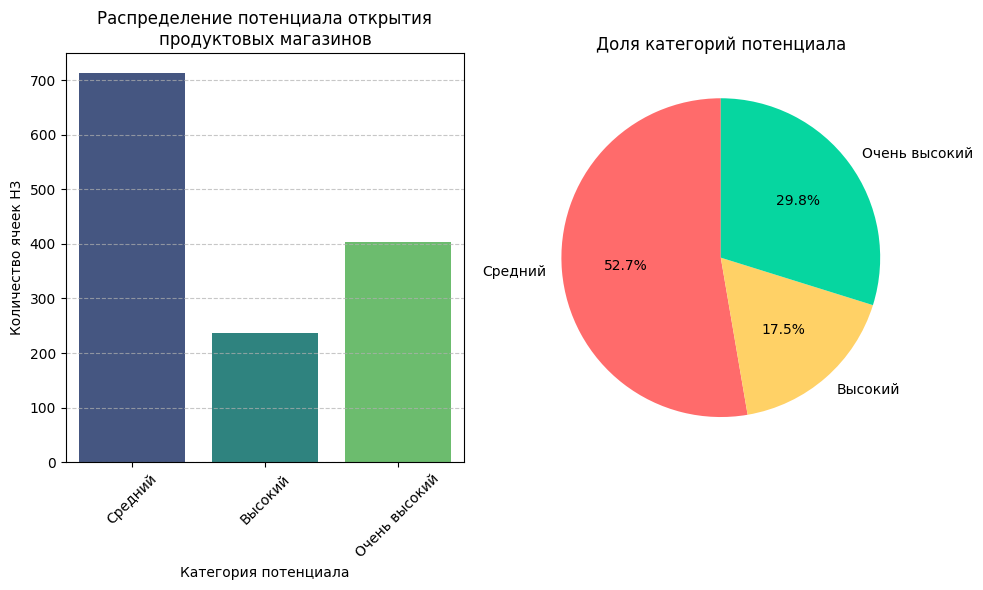


  Подготовка картографической визуализации...


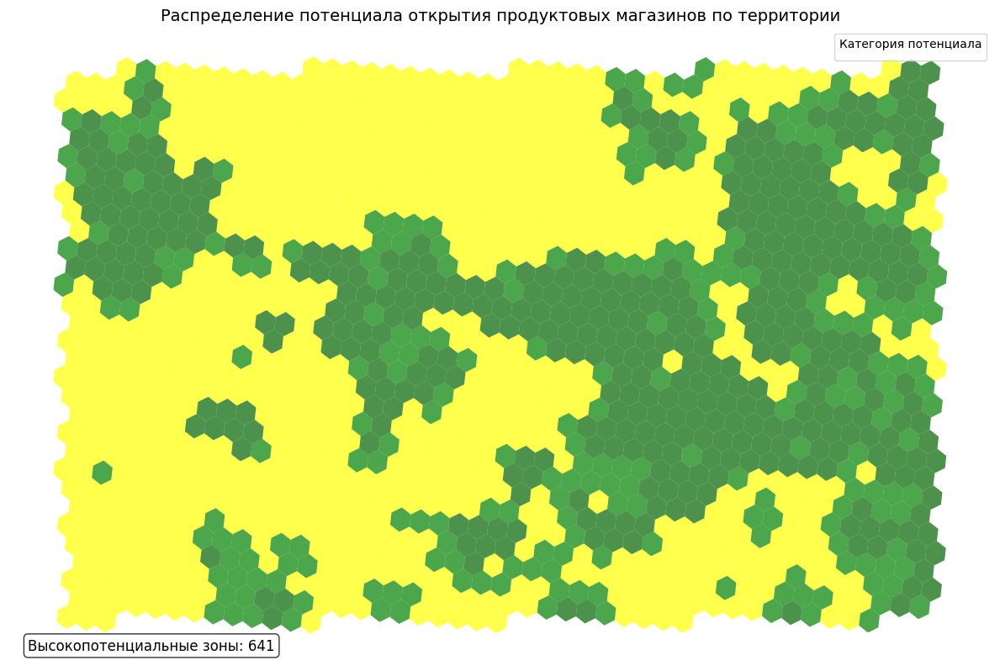

In [35]:
# Анализ распределения потенциала по категориям
if 'opening_potential_category' in h3_gdf.columns and h3_gdf['opening_potential_category'].nunique() > 1:
    potential_distribution = h3_gdf['opening_potential_category'].value_counts().sort_index()
    print("\n  Распределение потенциала открытия продуктовых магазинов по территории:")
    total_cells_count = len(h3_gdf)

    # Сортируем категории для логичного вывода (от низкого к высокому)
    category_order = ['Низкий', 'Средний', 'Высокий', 'Очень высокий']
    ordered_labels = [l for l in category_order if l in potential_distribution.index]

    for category in ordered_labels:
        count = potential_distribution[category]
        percentage = count / total_cells_count * 100
        print(f"    {category}: {count} ячеек ({percentage:.1f}%)")

    # Анализ географического распредеения высокопотенциальных зон
    high_potential_cells = h3_gdf[h3_gdf['opening_potential_category'].isin(['Высокий', 'Очень высокий'])]
    if len(high_potential_cells) > 0:
        print(f"\n  Анализ высокопотенциальных зон:")
        print(f"    Всего высокопотенциальных ячеек: {len(high_potential_cells)}")

        # Анализ кластеризации высокопотенциальных зон
        if len(high_potential_cells) > 1:
            from sklearn.cluster import DBSCAN
            from sklearn.preprocessing import StandardScaler

            # Подготовка координат для кластеризации
            coords = np.array([(geom.x, geom.y) for geom in high_potential_cells.geometry.centroid])

            if len(coords) > 5:  # Минимальное количество для кластеризации
                # Масштабируем координаты
                coords_scaled = StandardScaler().fit_transform(coords)

                # Кластеризация DBSCAN для выявления кластеров высокопотенциальных зон
                dbscan = DBSCAN(eps=0.5, min_samples=3)
                clusters = dbscan.fit_predict(coords_scaled)

                n_clusters = len(set(clusters)) - (1 if -1 in clusters else 0)
                n_noise = list(clusters).count(-1)

                print(f"    Выявлено кластеров высокопотенциальных зон: {n_clusters}")
                print(f"    Высокопотенциальных зон вне кластеров: {n_noise}")

                # Добавляем информацию о кластерах в DataFrame
                high_potential_cells = high_potential_cells.copy()
                high_potential_cells['cluster'] = clusters

                # Анализ характеристик кластеров
                if n_clusters > 0:
                    print(f"    Характеристики кластеров высокопотенциальных зон:")
                    for cluster_id in range(n_clusters):
                        cluster_cells = high_potential_cells[high_potential_cells['cluster'] == cluster_id]
                        avg_potential = cluster_cells['opening_potential'].mean()
                        avg_competition = cluster_cells['competitors_medium_count'].mean()
                        avg_residential = cluster_cells['residential_near_count'].mean()

                        print(f"      Кластер {cluster_id+1}: {len(cluster_cells)} ячеек, "
                              f"ср. потенциал: {avg_potential:.3f}, "
                              f"ср. конкуренция: {avg_competition:.1f}, "
                              f"ср. жилье: {avg_residential:.1f}")

    # Визуализация распределения потенциала
    plt.figure(figsize=(10, 6))

    # Столбчатая диаграмма распределения по категориям
    plt.subplot(1, 2, 1)
    sns.countplot(data=h3_gdf, x='opening_potential_category', order=ordered_labels, palette='viridis')
    plt.title('Распределение потенциала открытия\nпродуктовых магазинов')
    plt.xlabel('Категория потенциала')
    plt.ylabel('Количество ячеек H3')
    plt.grid(axis='y', linestyle='--', alpha=0.7)
    plt.xticks(rotation=45)

    # Круговая диаграмма для наглядности
    plt.subplot(1, 2, 2)
    category_counts = h3_gdf['opening_potential_category'].value_counts()
    # Упорядочиваем для круговой диаграммы
    ordered_counts = [category_counts.get(cat, 0) for cat in ordered_labels]
    colors = ['#ff6b6b', '#ffd166', '#06d6a0', '#118ab2']  # Красный, желтый, зеленый, синий

    plt.pie(ordered_counts, labels=ordered_labels, autopct='%1.1f%%',
            colors=colors, startangle=90)
    plt.title('Доля категорий потенциала')

    plt.tight_layout()
    plt.show()

    # Дополнительная визуализация: распределение потенциала по территории
    if 'geometry' in h3_gdf.columns:
        print(f"\n  Подготовка картографической визуализации...")

        # Создаем фигуру для карты
        fig, ax = plt.subplots(1, 1, figsize=(12, 10))

        # Определяем цветовую схему для категорий
        color_map = {
            'Низкий': 'red',
            'Средний': 'yellow',
            'Высокий': 'green',
            'Очень высокий': 'darkgreen'
        }

        # Отображаем каждую категорию своим цветом
        for category in ordered_labels:
            if category in color_map:
                category_gdf = h3_gdf[h3_gdf['opening_potential_category'] == category]
                if not category_gdf.empty:
                    category_gdf.plot(ax=ax, color=color_map[category],
                                     label=category, alpha=0.7)

        # Настраиваем легенду и заголовок
        ax.legend(title='Категория потенциала')
        ax.set_title('Распределение потенциала открытия продуктовых магазинов по территории',
                    fontsize=14)
        ax.set_axis_off()

        # Добавляем подпись с количеством высокопотенциальных зон
        if len(high_potential_cells) > 0:
            ax.text(0.02, 0.02, f'Высокопотенциальные зоны: {len(high_potential_cells)}',
                   transform=ax.transAxes, fontsize=12,
                   bbox=dict(boxstyle="round,pad=0.3", facecolor="white", alpha=0.8))

        plt.tight_layout()
        plt.show()

else:
    print("\n  Не удалось создать или визуализировать категории потенциала.")

    # Альтернативная визуализация: гистограмма непрерывного потенциала
    if 'opening_potential' in h3_gdf.columns:
        print("  Вместо этого отображаем распределение непрерывного потенциала...")

        plt.figure(figsize=(10, 6))
        plt.hist(h3_gdf['opening_potential'], bins=30, alpha=0.7, color='skyblue', edgecolor='black')
        plt.axvline(h3_gdf['opening_potential'].mean(), color='red', linestyle='--',
                   label=f'Среднее: {h3_gdf["opening_potential"].mean():.3f}')
        plt.xlabel('Потенциал открытия')
        plt.ylabel('Количество ячеек')
        plt.title('Распределение непрерывного потенциала открытия продуктовых магазинов')
        plt.legend()
        plt.grid(axis='y', linestyle='--', alpha=0.7)
        plt.show()

### **5.3. Пояснение**



*   Мы рассчитали итоговый показатель `opening_potential` для каждой ячейки H3, комбинируя оценку привлекательности места расположения (`environment_suitability`) и уровень конкуренции (`coffee_shops_medium_count`). Веса `ENV_WEIGHT` и `COMPETITION_WEIGHT` позволяют настроить баланс между этими факторами.
*   Нормализация конкуренции (деление на максимум) привела ее к шкале от 0 до 1, сопоставимой с `environment_suitability`.
*   Итоговый потенциал был также ограничен диапазоном [0, 1].
*   Для наглядности мы разбили непрерывный потенциал на 5 категорий с помощью квантилей и функции `pd.cut`. Обработка дубликатов в квантилях важна на случай, если много ячеек имеют одинаковое значение потенциала.
*   Анализ и визуализация распределения ячеек по категориям потенциала дают общее представление о перспективности исследуемой территории.



**Вывод по разделу:** Мы получили интегральную оценку потенциала каждой ячейки H3 для открытия кофейни, учитывающую как привлекательность самой локации, так и наличие конкурентов. Категоризация упрощает интерпретацию этих оценок.

## **Раздел 6. Визуализация и интерпретация результатов**



### **6.1. Интерактивная визуализация пространственных данных**

При решениии задач геоанализа особенно важно визуализировать значения на интерактивной карте.

Она позволяет:

*   Увидеть пространственные закономерности распределения потенциала.
*   Оценить расположение зон с высоким потенциалом относительно существующих кофеен и объектов инфраструктуры.
*   Легко идентифицировать конкретные перспективные локации.



Мы будем использовать библиотеку `leafmap` (которая основана на `ipyleaflet` и `folium`), чтобы создать интерактивную карту со следующими слоями:

*   **Тепловая карта (Choropleth):** Гексагоны H3, окрашенные в зависимости от значения `opening_potential`. Удобно использовать цветовую схему от красного (низкий потенциал) к зеленому (высокий потенциал).
*   **Маркеры существующих кофеен:** Позволяют видеть расположение конкурентов. Можно использовать кластеризацию маркеров (`MarkerCluster`) для областей с высокой плотностью.
*   **Маркеры рекомендуемых локаций:** Выделение ячеек с наивысшим потенциалом (например, топ-20), особенно тех, где нет конкурентов в непосредственной близости (`coffee_shops_near_count == 0`). Маркеры могут содержать всплывающие окна (popups) с подробной информацией о потенциале и характеристиках локации.

**Система координат:** Для отображения на веб-картах (как в `leafmap`) данные обычно должны быть в географической системе координат **WGS84 (EPSG:4326)**. Поэтому перед визуализацией мы преобразуем наш `h3_gdf` и `coffee_shops` обратно в эту систему с помощью метода `.to_crs("EPSG:4326")`.







### **6.2. Создание интерактивных карт с результатами**

Создадим основную карту с тепловой картой потенциала и маркерами, а затем отдельную карту для топ-локаций.

In [39]:
# --- Шаг 5: Визуализация результатов на карте ---

# Преобразование координат в WGS84
h3_gdf_wgs84 = h3_gdf.to_crs("EPSG:4326")
grocery_stores_wgs84 = grocery_stores.to_crs("EPSG:4326") if hasattr(grocery_stores, 'to_crs') else grocery_stores

# Создание карты
map_center = [(bbox[1] + bbox[3]) / 2, (bbox[0] + bbox[2]) / 2]
potential_map = leafmap.Map(center=map_center, zoom=11, layers_control=True)

# Добавляем слой с потенциалами для открытия как тепловую карту
potential_map.add_data(
    h3_gdf_wgs84,
    column="opening_potential",
    cmap="RdYlGn",
    scheme="FisherJenks",
    k=15,
    legend_title="Потенциал для открытия магазина",
    layer_name="Потенциал (тепловая карта)",
    style={"stroke": True, "color": "#333333", "weight": 0.3, "fillOpacity": 0.7}
)

In [41]:
# Добавляем маркеры существующих магазинов (если они есть)

if not grocery_stores_wgs84.empty:
    grocery_stores_wgs84['name'] = grocery_stores_wgs84['name'].fillna('Магазин без названия')
    markers = []
    for idx, row in grocery_stores_wgs84.iterrows():
        if row.geometry and not row.geometry.is_empty:
            center = row.geometry.centroid.coords[0][::-1]  # (lat, lon)
            popup_content = f"<b>{row['name']}</b>"
            for field in ['amenity', 'shop', 'cuisine', 'opening_hours']:
                if field in row and pd.notna(row[field]):
                    popup_content += f"<br>{field.capitalize()}: {row[field]}"
            markers.append(Marker(
                location=center,
                popup=HTML(popup_content),
                icon=AwesomeIcon(name='grocery', marker_color='red', icon_color='white'),
                tooltip=row['name']
            ))
    potential_map.add_layer(MarkerCluster(markers=markers))

In [47]:
# --- Добавление маркеров для топ-локаций ---
print("\n  Добавление маркеров для топ-локаций...")

# Находим топ-20 локаций с наибольшим потенциалом и без конкурентов рядом
top_locations_wgs84 = h3_gdf_wgs84[h3_gdf_wgs84['competitors_near_count'] == 0].sort_values(
    'opening_potential', ascending=False
).head(20)

print(f"  Найдено {len(top_locations_wgs84)} перспективных локаций без конкурентов")

# Импортируем folium для создания иконок
import folium

# Создаем разные иконки для топ-локаций
print("  Создание иконок для маркеров...")
top_potential_icon = folium.Icon(color='darkgreen', icon='trophy', prefix='fa')
potential_icon = folium.Icon(color='green', icon='star', prefix='fa')
high_potential_icon = folium.Icon(color='orange', icon='shopping-cart', prefix='fa')

# Добавляем маркеры рекомендуемых локаций
markers_added = 0
for i, (idx, row) in enumerate(top_locations_wgs84.iterrows()):
    if row.geometry and not row.geometry.is_empty:
        try:
            center = [float(row.geometry.centroid.y), float(row.geometry.centroid.x)]  # (lat, lon)

            # Выбираем иконку в зависимости от рейтинга
            if i < 3:
                current_icon = top_potential_icon  # Топ-3 - трофей
            elif i < 10:
                current_icon = potential_icon  # Топ-10 - звезда
            else:
                current_icon = high_potential_icon  # Остальные - корзина

            # Создаем информативный popup
            popup_content = f"""
            <div style="min-width: 250px; font-family: Arial, sans-serif;">
                <h4 style="margin-top:0; color: #2c3e50;">Рекомендуемая локация #{i+1}</h4>
                <div style="margin-bottom: 8px;"><b>Потенциал:</b> <span style="color: #e74c3c; font-weight: bold;">{row['opening_potential']:.3f}</span></div>
                <div style="margin-bottom: 8px;"><b>Привлекательность среды:</b> {row['environment_suitability']:.3f}</div>
                <div style="margin-bottom: 8px;"><b>Конкуренты в районе:</b> {int(row['competitors_medium_count'])}</div>
                <div style="margin-bottom: 8px;"><b>Категория потенциала:</b> {row['opening_potential_category']}</div>
                <hr style="margin: 10px 0;">
                <h5 style="margin-bottom: 8px;">Характеристики локации:</h5>
                <ul style="padding-left: 15px; margin: 0;">
            """

            # Добавляем инфраструктурные показатели
            infra_fields = {
                'residential_near_count': 'Жилые здания',
                'education_near_count': 'Образовательные учреждения',
                'transport_stops_near_count': 'Остановки транспорта',
                'offices_near_count': 'Офисные здания',
                'services_near_count': 'Объекты услуг'
            }

            for field, label in infra_fields.items():
                if field in row and pd.notna(row[field]):
                    value = row[field]
                    if isinstance(value, (int, float)):
                        popup_content += f"<li style='margin-bottom: 3px;'>{label}: <b>{int(value)}</b></li>"

            popup_content += f"""
                </ul>
                <div style="margin-top: 10px; padding: 8px; background-color: #f8f9fa; border-radius: 4px;">
                    <small>H3 индекс: <code>{row['h3_index']}</code></small>
                </div>
            </div>
            """

            # Добавляем маркер на карту
            potential_map.add_marker(
                location=center,
                popup=popup_content,
                icon=current_icon,
                tooltip=f"#{i+1} Потенциал: {row['opening_potential']:.3f}"
            )
            markers_added += 1

        except Exception as e:
            print(f"    Ошибка при добавлении маркера для локации {i+1}: {e}")
            continue

print(f"  Добавлено {markers_added} маркеров топ-локаций")

# Создаем легенду для маркеров с использованием leafmap
legend_html = '''
<div style="position: fixed;
            bottom: 50px; right: 50px; width: 200px; height: auto;
            background-color: white; border:2px solid grey; z-index: 9999;
            padding: 10px; border-radius: 5px; font-family: Arial, sans-serif;">
    <h5 style="margin-top:0; margin-bottom:8px;">Обозначения маркеров:</h5>
    <div style="margin-bottom: 5px;">
        <i class="fa fa-trophy" style="color: darkgreen; margin-right: 5px;"></i>
        <span style="font-size: 12px;">Топ-3 локации</span>
    </div>
    <div style="margin-bottom: 5px;">
        <i class="fa fa-star" style="color: green; margin-right: 5px;"></i>
        <span style="font-size: 12px;">Топ-4-10 локации</span>
    </div>
    <div style="margin-bottom: 5px;">
        <i class="fa fa-shopping-cart" style="color: orange; margin-right: 5px;"></i>
        <span style="font-size: 12px;">Топ-11-20 локации</span>
    </div>
    <div style="margin-bottom: 0;">
        <i class="fa fa-store" style="color: #e63946; margin-right: 5px;"></i>
        <span style="font-size: 12px;">Существующие магазины</span>
    </div>
</div>
'''

# Добавляем легенду с помощью add_html (совместимо с leafmap)
try:
    potential_map.add_html(legend_html)
    print("  Легенда маркеров успешно добавлена!")
except Exception as e:
    print(f"  Не удалось добавить легенду: {e}")

print("  Маркеры топ-локаций успешно добавлены!")

# Обновляем и сохраняем карту
output_map_path = "grocery_store_location_analysis_with_markers.html"
potential_map.save(output_map_path)
print(f"  Обновленная карта сохранена как: {output_map_path}")

# Отображаем статистику по топ-локациям
if not top_locations_wgs84.empty:
    print(f"\n  Статистика топ-{len(top_locations_wgs84)} локаций (без конкурентов):")
    print(f"    Средний потенциал: {top_locations_wgs84['opening_potential'].mean():.3f}")
    print(f"    Медианное количество жилых зданий: {top_locations_wgs84['residential_near_count'].median():.0f}")
    print(f"    Медианное количество остановок транспорта: {top_locations_wgs84['transport_stops_near_count'].median():.0f}")

    # Анализ распределения по категориям
    category_counts = top_locations_wgs84['opening_potential_category'].value_counts()
    print(f"    Распределение по категориям:")
    for category, count in category_counts.items():
        print(f"      {category}: {count} локаций")

# Анализ характеристик топ-локаций
if not top_locations_wgs84.empty:
    print(f"\n  Детальный анализ топ-3 локаций:")
    top_3 = top_locations_wgs84.head(3)
    for i, (idx, row) in enumerate(top_3.iterrows()):
        print(f"    #{i+1}: Потенциал {row['opening_potential']:.3f}, "
              f"жилые здания: {row['residential_near_count']:.0f}, "
              f"транспорт: {row['transport_stops_near_count']:.0f}")

# Отображаем карту
try:
    display(potential_map)
    print("\n✅ Карта с маркерами топ-локаций готова!")
except Exception as e:
    print(f"  Карта не может быть отображена в текущей среде: {e}")
    print(f"  Откройте файл {output_map_path} в браузере для просмотра")

# Дополнительно: экспорт данных о топ-локациях в CSV
try:
    import pandas as pd

    # Создаем DataFrame с ключевыми показателями топ-локаций
    export_columns = [
        'h3_index', 'opening_potential', 'opening_potential_category',
        'environment_suitability', 'competitors_medium_count',
        'residential_near_count', 'education_near_count',
        'transport_stops_near_count', 'offices_near_count'
    ]

    # Оставляем только существующие колонки
    available_columns = [col for col in export_columns if col in top_locations_wgs84.columns]

    top_locations_export = top_locations_wgs84[available_columns].copy()
    top_locations_export = top_locations_export.sort_values('opening_potential', ascending=False)

    # Добавляем рейтинг
    top_locations_export['rank'] = range(1, len(top_locations_export) + 1)

    # Сохраняем в CSV
    csv_filename = "top_grocery_locations.csv"
    top_locations_export.to_csv(csv_filename, index=False, encoding='utf-8')
    print(f"  Данные о топ-локациях экспортированы в {csv_filename}")

except Exception as e:
    print(f"  Не удалось экспортировать данные: {e}")


  Добавление маркеров для топ-локаций...
  Найдено 20 перспективных локаций без конкурентов
  Создание иконок для маркеров...
    Ошибка при добавлении маркера для локации 1: The 'popup' trait of a Marker instance expected a Widget or None, not the str '\n            <div style="min-width: 250px; font-family: Arial, sans-serif;">\n                <h4 style="margin-top:0; color: #2c3e50;">Рекомендуемая локация #1</h4>\n                <div style="margin-bottom: 8px;"><b>Потенциал:</b> <span style="color: #e74c3c; font-weight: bold;">0.947</span></div>\n                <div style="margin-bottom: 8px;"><b>Привлекательность среды:</b> 0.958</div>\n                <div style="margin-bottom: 8px;"><b>Конкуренты в районе:</b> 2</div>\n                <div style="margin-bottom: 8px;"><b>Категория потенциала:</b> Очень высокий</div>\n                <hr style="margin: 10px 0;">\n                <h5 style="margin-bottom: 8px;">Характеристики локации:</h5>\n                <ul style="padding-lef

Map(center=[55.82785, 37.2793], controls=(ZoomControl(options=['position', 'zoom_in_text', 'zoom_in_title', 'z…


✅ Карта с маркерами топ-локаций готова!
  Данные о топ-локациях экспортированы в top_grocery_locations.csv


In [50]:
# --- Карта с фокусом на топ-K локациях ---
def visualize_top_locations(h3_gdf_vis, k=10, competition_filter=True):
    """Визуализирует топ-k локаций с наивысшим потенциалом на отдельной карте"""
    print(f"\nСоздание карты для топ-{k} локаций...")
    # Убедимся, что данные в WGS84
    if h3_gdf_vis.crs != "EPSG:4326":
        h3_gdf_vis = h3_gdf_vis.to_crs("EPSG:4326")

    # Фильтруем по отсутствию конкурентов рядом, если competition_filter=True
    if competition_filter:
        filtered_gdf = h3_gdf_vis[h3_gdf_vis['competitors_near_count'] == 0].copy()
        print(f"  (Фильтр: без конкурентов в ближнем радиусе)")
        if filtered_gdf.empty:
            print(f"  Предупреждение: Не найдено локаций без конкурентов поблизости. Показываем топ-{k} из всех.")
            filtered_gdf = h3_gdf_vis.copy() # Если таких нет, берем из всех
    else:
        filtered_gdf = h3_gdf_vis.copy()

    # Сортируем и выбираем топ-k
    top_k_gdf = filtered_gdf.sort_values('opening_potential', ascending=False).head(k)

    if top_k_gdf.empty:
        print(f"  Не найдено локаций для отображения топ-{k}.")
        return None

    # Создание карты с центром по выбранным локациям
    try:
        # total_bounds может вызвать ошибку, если gdf пустой
        bbox_top_k = top_k_gdf.total_bounds
        center_top_k = [(bbox_top_k[1] + bbox_top_k[3]) / 2, (bbox_top_k[0] + bbox_top_k[2]) / 2]
        top_map = leafmap.Map(center=center_top_k, zoom=12) # Zoom можно настроить
    except Exception as e:
         print(f"  Ошибка при расчете центра для карты топ-{k}: {e}. Используем центр основной карты.")
         top_map = leafmap.Map(center=map_center, zoom=14)


    # Добавляем гексагоны топ-k как слой с цветовой кодировкой по рангу
    top_k_gdf['rank'] = range(1, len(top_k_gdf) + 1) # Ранг от 1 до k
    top_map.add_data(
        top_k_gdf,
        column="rank", # Раскрашиваем по рангу
        cmap="RdYlGn_r", # Обратная схема: зеленый для топ-1
        scheme="EqualInterval", # Простое разбиение рангов
        k=len(top_k_gdf), # Количество классов = k
        legend_title="Ранг локации",
        layer_name=f"Топ-{k} локации (гексагоны)",
        style={"stroke": True, "color": "black", "weight": 1.5, "fillOpacity": 0.75}
    )

    # Добавляем маркеры с рангом и информацией
    print(f"  Добавление маркеров для топ-{k} локаций...")
    for i, (_, row) in enumerate(top_k_gdf.iterrows()):
        rank = row['rank']
        centroid = row.geometry.centroid
        center_latlon = (centroid.y, centroid.x) # (lat, lon)

        # Создаем popup для маркера
        popup_html = f"""<div style="min-width:200px">
            <h4 style="margin-top:0; color: darkgreen;">Локация #{rank}</h4>
            <div><b>Потенциал:</b> {row['opening_potential']:.3f} ({row.get('potential_category', 'N/A')})</div>
            <div><b>Среда:</b> {row['environment_suitability']:.3f}</div>
            <div><b>Конкуренты (сред):</b> {int(row['competitors_medium_count'])}</div>
            <div><b>Координаты:</b> {centroid.y:.6f}, {centroid.x:.6f}</div>
        </div>"""

        # Добавляем маркер
        top_map.add_marker(
            location=center_latlon,
            popup=HTML(popup_html),
            tooltip=f"Локация #{rank} (Потенциал: {row['opening_potential']:.3f})",
            icon=AwesomeIcon(name='star', marker_color='darkgreen', icon_color='white', spin=(rank<=3)), # Топ-3 маркеры вращаются
            name=f"Маркер #{rank}"
        )

    # Вывод координат топ-k локаций в консоль
    print(f"\n--- Топ-{k} локаций {'без конкурентов поблизости' if competition_filter else ''} ---")
    for i, (_, row) in enumerate(top_k_gdf.iterrows()):
        coords = row.geometry.centroid
        print(f"{i+1}. Координаты: {coords.y:.6f}, {coords.x:.6f} | Потенциал: {row.opening_potential:.3f} | Категория: {row.get('potential_category', 'N/A')} | H3 Индекс: {row.h3_index}")

    return top_map

# Визуализация топ-10 локаций без конкурентов поблизости и вывод координат
top_map_viz = visualize_top_locations(h3_gdf_wgs84, k=10, competition_filter=True)
if top_map_viz:
    print("\nОтображение карты топ-10 локаций...")
    display(top_map_viz)


Создание карты для топ-10 локаций...
  (Фильтр: без конкурентов в ближнем радиусе)
  Добавление маркеров для топ-10 локаций...

--- Топ-10 локаций без конкурентов поблизости ---
1. Координаты: 55.800548, 37.377260 | Потенциал: 0.947 | Категория: Очень высокий | H3 Индекс: 8911aa46923ffff
2. Координаты: 55.839501, 37.369329 | Потенциал: 0.889 | Категория: Очень высокий | H3 Индекс: 8911aa09bbbffff
3. Координаты: 55.863853, 37.376739 | Потенциал: 0.874 | Категория: Очень высокий | H3 Индекс: 8911aa72453ffff
4. Координаты: 55.797685, 37.379297 | Потенциал: 0.873 | Категория: Очень высокий | H3 Индекс: 8911aa4692bffff
5. Координаты: 55.866152, 37.385008 | Потенциал: 0.862 | Категория: Очень высокий | H3 Индекс: 8911aa72447ffff
6. Координаты: 55.847478, 37.170612 | Потенциал: 0.829 | Категория: Очень высокий | H3 Индекс: 8911aa0b52bffff
7. Координаты: 55.859818, 37.349899 | Потенциал: 0.829 | Категория: Очень высокий | H3 Индекс: 8911aa09987ffff
8. Координаты: 55.850335, 37.168562 | Потенц

Map(center=[np.float64(55.83191809611247), np.float64(37.27679017408703)], controls=(ZoomControl(options=['pos…

### **6.3. Пояснение**



*   Мы создали две интерактивные карты:
    1.  **Обзорная карта:** Показывает распределение потенциала успешности открытия кофейни (`opening_potential`) по всей исследуемой территории с помощью окрашенных гексагонов (choropleth). На ней также отображены существующие кофейни (белые чашки) и топ-20 рекомендуемых локаций без ближайших конкурентов (звезды/трофеи). Всплывающие окна маркеров содержат детальную информацию.
    2.  **Карта топ-локаций:** Фокусируется на K лучших локациях (по умолчанию K=10 и без ближайших конкурентов), отображая их гексагоны и маркеры с основной информацией. Координаты этих локаций также выводятся в текстовом виде.
*   Использование `leafmap` и `ipyleaflet` позволяет создавать насыщенные интерактивные визуализации прямо в среде выполнения кода.
*   Настройка `cmap` (цветовая схема), `scheme` (алгоритм классификации для раскраски), `style` (стили отображения), `Marker`, `AwesomeIcon`, `MarkerCluster` и `popup` (всплывающие окна с HTML) позволяет гибко кастомизировать внешний вид карты.
*   Функция `visualize_top_locations` инкапсулирует логику фильтрации, сортировки и отображения лучших локаций.



**Вывод по разделу:** Интерактивные карты являются важным результатом геоанализа. Они позволяют наглядно представить распределение потенциала, увидеть расположение конкурентов и детально изучить характеристики наиболее перспективных локаций, что существенно облегчает принятие решения об открытии новой точки.

## **Заключение**


### **Обобщение изученного материала**


В данном блокноте мы прошли полный цикл пространственного анализа для определения оптимальной локации кофейни:

1.  **Сбор данных:** Загрузили данные о существующих кофейнях и разнообразных объектах инфраструктуры из OpenStreetMap для выбранной области интереса (ROI).
2.  **Предобработка:** Создали гексагональную сетку H3 и спроецировали все данные в метрическую систему координат.
3.  **Feature Engineering:** Рассчитали для каждой ячейки H3 набор пространственных признаков, характеризующих ее окружение (количество, площадь, длина объектов в ближнем и среднем радиусе).
4.  **Оценка привлекательности места расположения:** Обучили и сравнили модели машинного обучения (Random Forest, Gradient Boosting) для предсказания вероятности того, что среда в ячейке благоприятна для кофейни (на основе расположения существующих). Проанализировали важность различных факторов места расположения, а также рассмотрели улучшение модели с помощью кластеризации.
5.  **Расчет потенциала потенциала успешности открытия кофейни:** Разработали интегральный показатель потенциала успешности открытия кофейни, учитывающий как привлекательность места расположения (предсказанную моделью), так и уровень конкуренции.
6.  **Визуализация:** Представили результаты на интерактивных картах, отобразив распределение потенциала, расположение конкурентов и выделив наиболее перспективные локации.

### **Рекомендации по развитию данной тематики при написании ВКР:**



*   **Другие источники данных:**
    *   **Демографические данные:** Плотность населения, возрастные группы, уровень дохода (если доступны).
    *   **Данные о пешеходном и автомобильном трафике:** Могут быть получены из специализированных сервисов или смоделированы.
    *   **Данные о коммерческой недвижимости:** Стоимость аренды, тип помещений.
    *   **Данные социальных сетей:** Чекины, отзывы о местах.
*   **Более сложные модели:**
    *   **Модели регрессии:** Предсказание не бинарного факта наличия кофейни, а, например, потенциального оборота или количества посетителей (требует соответствующих данных для обучения).
    *   **Географически взвешенная регрессия (GWR):** Учитывает пространственную неоднородность – влияние факторов может меняться в разных частях города.
    *   **Модели глубокого обучения:** Для анализа спутниковых снимков или данных о мобильности.
*   **Продвинутый пространственный анализ:**
    *   **Анализ зон доступности (Isochrones):** Определение областей, из которых можно добраться до точки за определенное время пешком или на транспорте.
    *   **Сетевой анализ:** Расчет кратчайших путей, анализ связности графа дорог.
    *   **Анализ видимости (Viewshed analysis):** Оценка того, насколько точка видна с окружающих улиц.
*   **Автоматизация и развертывание:** Создание веб-приложения (например, с использованием Streamlit или Dash) для интерактивного выбора ROI и получения результатов анализа.

### **Возможные направления применения**









Описанный подход не ограничивается только кофейнями. Его можно адаптировать для определения оптимальных локаций для широкого круга объектов:

*   Магазины розничной торговли (продуктовые, одежда, электроника).
*   Рестораны и другие точки общественного питания.
*   Аптеки, банки, салоны красоты.
*   Пункты выдачи заказов (ПВЗ).
*   Зарядные станции для электромобилей.
*   Объекты социальной инфраструктуры (детские сады, поликлиники – с учетом других критериев).
*   Банкоматы.

Основой является правильный подбор факторов (признаков), релевантных для конкретного типа бизнеса, и адаптация модели оценки потенциала.